# **Business Understanding**
## **Context**
Philadelphia Buildings Database ini memuat informasi tentang karakteristik fisik dan lokasi bangunan di kota Philadelphia. Data ini dapat menjadi referensi untuk penyewaan, perencanaan, zonasi dan, pemeliharaan properti.

Dataset ini bersumber dari https://opendataphilly.org/. Situs tersebut adalah portal yang menyediakan akses ke lebih dari 300 set data, aplikasi, dan API yang terkait dengan wilayah Philadelphia. Kemudahan dan kebebasan mengakses data ini bertujuan untuk mendorong kinerja pemerintah yang lebih baik dan juga lebih transparan kepada masyarakat.

`The Office of Property Assessment (OPA)` adalah salah satu departemen dalam pemerintahan Kota Philadelphia yang bertugas untuk menentukan nilai setiap properti di Philadelphia. Asesmen harga dari OPA digunakan untuk menghitung pajak properti yang harus dibayar oleh pemilik.

Secara terbuka, OPA menerima pengajuan untuk pengurangan maupun pengecualian yang dapat mengurangi pajak properti. Jika pemilik properti tidak setuju dengan penilaian atau yakin bahwa pengurangan atau pengecualian belum diterapkan dengan benar, OPA menawarkan pilihan untuk meminta peninjauan ulang atau mengajukan banding. Oleh karena itu, sebagai stakeholder, OPA membutuhkan analisis secara mendalam dan sebuah alat atau tool yang dapat membantu OPA dalam menentukan harga properti secara akurat. Kasus ini menjadi sangat penting karena pajak merupakan salah satu sumber pendapatan pemerintah yang akan digunakan untuk perencanaan anggaran kota.

Dalam skala besar, setiap negara memiliki target pendapatan melalui pajak dengan ketentuan dan sistem yang berbeda-beda. Skala lebih kecilnya, pendapatan dari pajak tersebut dikumpulkan dari region, subregion, maupun kota. Pendapatan ini akan dialokasikan dalam beberapa klasifikasi anggaran sesuai kebutuhan kota, termasuk pembangunan, pendidikan, maupun fasilitas umum. Kota Philadelphia memiliki dataset yang berisi harga pasar (market value) setiap properti di kota yang digunakan untuk perhitungan pajak. Seiring berjalannya waktu, akan ada properti-properti baru yang dibangun di Kota Philadelphia yang harga pasarnya belum ditaksasi. Oleh karena itu, penting bagi pemerintah untuk mengetahui proyeksi nominal pendapatan yang akan diterima sebelum menyusun anggaran agar alokasi anggaran menjadi tepat sasaran sesuai target.

Data terbaru di tahun 2020, dilansir pada tautan https://www.pewtrusts.org/en/research-and-analysis/reports/2022/09/how-property-is-taxed-in-philadelphia, total pendapatan (*general revenue*) Kota Philadelphia berjumlah $4,834 M dengan rincian sebagai berikut:
- $  699 M   (14.5%) dari pajak properti
- $2,124  M  (43.9%) dari pajak upah, penghasilan, dan laba bersih
- $1,229 M    (25.4%) dari pajak lainnya
- $  782  M  (16.2%) dari selain pajak


![Tax Property in Philadelphia comapre with other city ](assets/tax.png)

Gambar di atas juga menunjukkan persentase pendapatan yang diwakili oleh pajak properti di Philadelphia dan 10 kota lainnya untuk tahun fiskal 2020, tahun terbaru yang data lengkapnya tersedia. Bagian pendapatan dari pajak properti di Philadelphia sebesar 14,5% dari pendapatan dana umum, kurang dari separuh median 31,5%. Dalam hal pendapatan kota secara keseluruhan, pajak properti memberikan kontribusi sebesar 9,5% di Philadelphia, lebih rendah dibandingkan dengan kota lain yang dipertimbangkan kecuali Columbus, dan juga kurang dari separuh median. 


Dari data di atas dapat dilihat bahwa pajak Kota Philadelphia berkontribusi cukup rendah pada pendapatan kota dibandingkan kota-kota lainnya. Oleh karena itu, kasus ini menjadi penting karena dengan adanya model yang dapat memprediksi harga pasar properti secara akurat berpotensi mengoptimalisasi pendapatan kota.   

## **Problem Statement**
1. Bagaimana caranya memprediksi harga properti sehingga perhitungak pajak menjadi akurat?
1. Jenis properti apa yang sebaiknya diprioritaskan terlebih dahulu untuk efisiensi waktu dan biaya dalam pembuatan model machine learning?
1. Model machine learning apa yang sebaiknya digunakan untuk menghitung nilai properti secara akurat?

## **Goals**
Membuat sebuah model machine learning yang dapat membantu OPA untuk **menentukan harga pasar properti baru (*market value*) yang belum ditaksasi di Kota Philadelphia**.
## **Analytic Approach**
Jadi dari penjabaran di atas, kami akan menganalisis data untuk dapat menemukan pola dari fitur-fitur yang ada, yang membedakan fitur tertentu seperti lokasi, tanggal, luas dengan yang lainnya dalam hal market value pada jenis gedung perumahan (Residentials atau single Family).

Selanjutnya, kami akan membangun suatu model regresi yang akan membantu perusahaan/badan/lembaga untuk dapat menyediakan 'tool' atau model prediktif yang mampu prediksi market value of property (khususnya jenis perumahan/Residentials) di kota philadelpia di waktu dan lokasi tertentu. Disini kami akan melakukan eksperimen dengan beberapa algoritma model regresi yang sering digunakan seperti Linear Regression, KNN, SGD, Random Forest, XGB, dan LGBM. Dimana kami akan memilih satu model (atau gabungan dari beberapa model) untuk membuat tool tersebut yang sesuai dengan data dari Office of Property Assesment (OPA) https://opendataphilly.org/datasets/philadelphia-properties-and-assessment-history/. \\

*Catatan : rentang tahun data terakhir di update sampai tahun 2020*
## **Evaluation Metrics**
### **Scale-dependent errors**
- `MAE`


**MAE (Mean Absolute Error)** menghitung rata-rata dari selisih absolut antara nilai prediksi dan nilai aktual. MAE dapat digunakan untuk melihat performa model secara umum (skala sama) dengan meminimalisir efek outliers.

| Metric | Details |
| ----- | ----- |
| **MAE** | + Mudah diinterpretasi, robust terhadap outlier (- tidak membedakan overestimation dan underestimation) |

- **RMSLE (Root Mean Squared Log Error)**
    Karena sebaran nilai market value yang lebar (wide range) maka disini kami juga akan menggunakan RMSLE (Root Mean Squared Log Error) yang dimana metric ini hanya mempertimbangkan kesalahan relatif antara antara nilai prediksi dan nilai aktual (dalam skala logaritmik). RMSLE juga memiliki sifat menimbulkan penalti/error yang lebih besar untuk estimasi yang terlalu rendah (underestimated) dari variabel aktual daripada estimasi yang lebih tinggi (overestimated).

    RMSLE :

    \begin{equation}
    \sqrt{\frac{1}{n} \sum_{i=1}^{n} (\log(p_i + 1) - \log(a_i + 1))^2} 
      \end{equation}

  Dimana:
- \(RMSLE\) : Root Mean Squared Logarithmic Error,
- \(n\) :  jumlah data,
- \(p_i\) : nilai hasil prediksi data ke- \(i\) ,
- \(a_i\) nilai aktual (ground truth) data ke \(i\),
- \(\log\) fungsi logaritma natural

### **Percentage errors**
- `MAPE`
**MAPE (mean absolute percentage error)** menghitung rata-rata selisih persentase absolut antara nilai aktual dan nilai prediksi. MAPE memiliki penalti error yang lebih besar untuk overestimation, sehingga cocok untuk mengetahui seberapa besar error pada prediksi yang overestimate.

| **Metric** | **Details** |
| ----- | ----- |
| **MAPE** | + Dapat untuk membandingkan model yang berbeda dengan skala yang sama (- tidak dapat diterapkan jika `y=0`) |


Berdasarkan [International and Business Forecasting Methods](https://openlibrary.org/books/OL3072138M/Industrial_and_business_forecasting_methods) oleh Lewis, C.D. nilai MAPE dapat diinterpretasikan:

|**MAPE value** | **Description**
|----- | ----- |
|0-10% | Highly Accurate
| 10-20% | Good
| 20-50% | Reasonable
| >50% | Innacurate

## **Target**

Berdasarkan jurnal [Data Mining and Analysis Predictions of Real Estate Prices](https://iacis.org/iis/2015/4_iis_2015_30-36.pdf) di Washington, USA. Mereka memperoleh MAE sebesar 102,968 USD ketika memprediksi harga properti pada tahun 2013 dengan median harga 350,000 USD. Karena dataset yang kami gunakan memiliki data pada tahun 2020, maka kami ikut sertakan [laju inflasi](https://www.macrotrends.net/countries/USA/united-states/inflation-rate-cpi) **untuk mengukur batas wajar toleransi MAE dari model kami, yaitu 42,000 USD** (2.3x lebih rendah dari jurnal referensi karena perbedaan harga properti di Washington dan Philadelphia). 

berarti pemerintah bisa underestimate pendapatan pajak (untuk budget planning lebih baik underestimate daripada over karena belum tentu pendapatan pajak terserap semua) hingga 18k USD atau 13% dari nilai aktual, dengan kata lain model lebih baik 2.3 kali lipat dalam memprediksi market value.

Maka terget yang akan kita coba capai adalah 

|**Metric** | **Target**
|----- | ----- |
|MAPE| <= 42k USD
| MAPE | <= 13%


**Pertimbangan:**

* Menurut [Thumbtack](https://www.thumbtack.com/pa/philadelphia/land-surveyors), waktu yang dibutuhkan untuk pembuatan laporan setelah dilakukan survei rata-rata 2 minggu

# **Data Understanding**
## **Attributes Information**
| **Attribute** | **Data Type** | **Description** |
| --- | --- | --- |
| assessment_date | Object | Tanggal penilaian terakhir diubah|
| basements | Object | Jenis basement pada properti: <br/>0. Tidak ada basement<br/>A. Full Finished<br/>B. Full Semi-Finished<br/>C. Full Unfinished<br/>D. Full – Unknown Finish<br/>E. Partial Finished, F. Partial Semi-Finished, G. Partial Unfinished, H. Partial - Unknown Finish, I. Unknown Size - Finished, J. Unknown Size - Unfinished |
| beginning_point | Object | Titik pertama pada batas properti yang dijelaskan. |
| book_and_page  | Object | Menunjukkan dokumen pesanan yang telah diterima. |
| building_code  | Object | Kode gedung dengan 5 karakter alfanumerik. Namun dua digit terendah tidak digunakaan pada saat ini. |
| building_code_description   | Object | Deskripsi dari kode gedung. |
| category_code | int64 | Kode kategori properti.<br/> 1. Residential<br/>2. Hotels and Apartments<br/>3. Store with Dwelling<br/>4. Commercial<br/>5. Industrial<br/>6. Vacant Land |
| category_code_description   | Object | Deskripsi dari kode kategori properti. |
| census_tract   | float64 | Wilayah yang ditetapkan oleh Biro Sensus. |
| central_air   | Object | Y mengindikasikan adanya udara sentral. N mengindikasikan tidak adanya udara sentral. |
| cross_reference    | Object | Nomor terakhir dari rekening untuk transfer. |
| date_exterior_condition    | Object | Tanggal pencatatan kondisi eksterior. |
| depth | float64 | Kedalaman yang diukur dari jalan utama ke garis belakang properti atau jalan sekunder. Dalam kasus perbedaan kedalaman dari garis samping paralel, akan diambil rata-ratanya. Dalam kasur yang tidak biasa, akan diambil ukuran terdalam. Pada daerah sudut, kedalaman yang digunakan adalah bagian depan dari jalan sekunder. |
| exempt_building  | float64 | Pengecualian penilaian bangunan pada sertifikasi. |
| exempt_land | float64 | Pengecualian penilaian tanah pada sertifikasi. |
| exterior_condition | float64 | Berkaitan dengan bagaimana kondisi eksterior yang tampak berdasarkan pengamatan.<br/>0. Tidak Berlaku<br/>1. Konstruksi Baru - Konstruksi yang terlihat lebih baru daripada properti di sekamirnya.<br/>2. Direhabilitasi - Properti lebih unggul dari sebagian besar properti lain di blok tersebut.<br/>3. Di atas rata-rata - Properti terawat dengan baik dimana pemiliknya melakukan perawatan preventif secara berkelanjutan. Kondisi fisik eksterior lebih baik daripada rata-rata namun kurang dari direhabilitasi.<br/>4. Rata-rata - Kondisi yang khas dan paling umum diamati pada eksterior sebagian besar properti diblok tersebut. Tidak ada pekerjaan yang signifikan untuk pengecatan, pertukangan, dsb. Tidak ada kerusakan yang terlihat dengan jelas.<br/>5. Dibawah rata-rata - Perawatan ditunda secara berlebihan. Terdapat penyalahgunaan, keausan, vandalisme kecil, atau kerusakan akibat kebakaran yang tidak diperbaiki.<br/>6. Vacant - Tidak dihuni. Kemungkinan terdapat erdapat tanda FHA, VA, FNMA. Pintu dan jendela diamankan dengan kayu baru.<br/>7. Segel - Pintu dan jendela properti ditutup dengan kayu, timah, balok beton, atau plesteran. Tidak terdapat akses kedalam.<br/>8. Struktur Membahayakan / Terbuka - Beberapa properti tidak memiliki jendela, pintu, atau pintu terbuka. Terlihat bukti vandalisme seperti grafitti, pagar yang hilang, kayu dan metal yang rusak, dsb. Terdapat tanda kerusakan akibat api atau air pada batu bata, dinding, dsb. Jendela pecah dengan interior yang menghitam. |
| fireplaces | float64 | Sebagian besar properti di Philadelphia tidak memiliki perapian. Properti yang tidak memiliki perapian akan dibiarkan kosong. Jika terdapat perapian, akan diisi total perapian yang tersedia. |
| frontage | float64 | Lebar kavling yang berbatasan dengan jalan utama. |
| fuel | Object | Bahan bakar pemanas.<br/>a. Gas alam<br/>b. Pemanas minyak.<br/>c. Listrik (biasanya lebih dari 150amp).<br/>d. Batu bara<br/>e. Tenaga surya<br/>f. Kayu<br/>g. Lainnya<br/>h. Tidak tersedia |
| garage_spaces | float64 | Ruang garasi. |
| garage_type | Object | Tipe garasi.<br/>Terdapat dua jenis parkir, yaitu garasi / carport dan parkir di jalanan terbuka. Garasi / carport dapat berupa :<br/>0. Tidak ada<br/>A. Basement / Built-In - Dibangun di ruang bawah tanah atau dibelakang hunian. Atau dibangun kedalam lantai pertama.<br/>B. Garasi Terhubung - Garasi terhubung ke tempat tinggal.<br/>C. Garasi Terpisah - Garasi pada bangunan lain yang terpisah dengan tempat tinggal.<br/>F. Converted - Garasi yang dialihfungsikan.<br/>S. Self Park - Parkir mandiri.<br/>T. Attendand - Parkir dengan petugas. |
| general_construction  | Object | Konstruksi umum. |
| geographic_ward  | float64 | Subdivisi dari kota berdasarkan geografis sebelum dibentuk divisi semu 77, 78, dan 88. |
| homestead_exemption | float64 | Pembebasan pajak, adalah hukum untuk melindungi nilai rumah penduduk dari pajak properti, kreditor, dan keadaan yang timbul dari kematian pasangan pemilik rumah.|
| house_extension | int64 | Terletak dalam nomor alamat properti untuk properti tertentu, ini akan menjadi nomor tertinggi |
| house_number | int64 | Lima digit angka yang menunjukkan alamat properti tertentu yang terletak di blok |
| interior_condition | float64	 | Menunjukkan kondisi keseluruhan interior: <br/>0. Not Applicable<br/>2. New / Rehabbed<br/>3. Above Average<br/>4. Average<br/>5. Below Average<br/>6. Vacant – No occupancy<br/>7. Sealed / Structurally Compromised |
| location | Object | Lokasi, menggunakan nomor rumah, kode jalan dan nomor unit dan rumah |
| mailing_address_1 | Object | Alamat email 1 |
| mailing_address_2  | Object | Alamat email 2 |
| mailing_care_of   | Object | Alamat email 'care of' |
| mailing_city_state  | Object | Alamat email bagian kota |
| mailing_street   | Object | Alamat email jalan |
| mailing_zip  | Object | Alamat email zip |
| market_value | float64	 | Nilai properti yang ditentukan |
| market_value_date | float64	 | Tanggal terakhir kali *market_value* ditinjau. Terdiri dari bulan dan tahun |
| number_of_bathrooms | float64	 | Jumlah kamar mandi |
| number_of_bedrooms | float64	 | Jumlah kamar tidur |
| number_of_rooms | float64	 | Jumlah ruangan |
| number_stories | float64	 | Jumlah tingkat properti |
| off_street_open  | float64	 | Tidak ada keterangan |
| other_building   | Object | Keberadaan bangunan lain selain bangunan utama |
| owner_1  | Object | Nama pertama yang tercantum di akta |
| owner_2  | Object | Nama kedua yang tercantum di akta |
| parcel_number | int64 | Sembilan digit unik yang dibuat oleh Staf Dewan Revisi Pajak untuk mengidentifikasi properti tertentu |
| parcel_shape  | Object | Tidak ada keterangan |
| quality_grade | float64	 | Tingkat kualitas berkaitan dengan pengerjaan dan bahan bangunan |
| recording_date  | Object | Tanggal akta diajukan ke pencatatan |
| registry_number  | Object | Nomor identifikasi pada pemetaan |
| sale_date| Object | tanggal penjualan properti |
| sale_price | float64 | Harga penjualan properti |
| separate_utilities  | Object | Fasilitas lain yang terpisah dari properti: <br/>a. Terpusat (satu pemanas, tangki air panas, layanan listrik dan layanan gas)<br/>b. Sebagian terpisah (tidak terpusat atau tidak semua terpisah)<br/>c. Semua terpisah |
| sewer  | Object | Selokan |
| site_type  | Object | Tidak ada keterangan |
| state_code | float64 | Kode negara bagian/ daerah |
| street_code | int64 | Kode jalan |
| street_designation | Object | Tipe jalanan pada tempat properti terletak |
| street_direction  | Object | Arah mata angin jalan |
| street_name  | Object | nama jalan |
| suffix  | Object | ekstension dari alamat |
| taxable_building | float64	 | Tarif pajak bangunan dari properti |
| taxable_land | float64	 | Tarif pajak bumi dari properti |
| topography | Object | Jenis permukaan tanah dari properti<br/>a. Above Street Level<br/>b. Below Street Level<br/>c. Flood Plain<br/>d. Rocky <br/>e. Relates to anything not identified here that may be observed that may have some effect on value.<br/>f. Street Level. |
| total_area | float64 | Luas tanah dari properti |
| total_livable_area | float64 | Luas bangunan dari properti |
| type_heater | Object | Jenis pemanas dari properti<br/>a. Hot air (ducts)<br/>b. Hot water (radiators or baseboards)<br/>c. Electric baseboard<br/>d. Heat pump (outside unit)<br/>e. Other<br/>g. Radiant<br/>h. Undetermined<br/>O. None |
| unfinished | Object | Status apakah properti sudah/belum selesai dibangun |
| unit  | Object | Nomor unit properti (khusus kondominium) |
| utility  | Object | Tidak ada keterangan |
| view_type | Object | Pemandangan dari jendela, dek, teras, atau balkon properti<br/>I. Typical / Other.<br/>0. Not Applicable.<br/>a. Cityscape / Skyline<br/>b. Flowing Water<br/>c. Park/Green Area<br/>d. Commercial<br/>e. Industrial<br/>h. Edifice / Landmark |
| year_built | Object | Tahun properti dibangun |
| year_built_estimate | Object | status apakah tahun properti dibangun telah diprediksi |
| zip_code | Object | Kode pos |
| zoning | Object | Kode zonasi properti<br>- single-family house : "RSD", "RSA"<br>- multi-family house : "RTA", "RM"<br>- commercial or industrial : "CMX", "RMX", "CA", "IRMX", "ICMX", "I", "IP"<br>- special-purpose : "SPINS", "SPPOA"|
| objectID | int64 | Kode unique untuk setiap properti |

In [2]:
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import plotly.express as px
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')
import time

In [3]:
df_raw = pd.read_csv("PHL_OPA_PROPERTIES.csv")
df_raw.head()

,assessment_date,basements,beginning_point,book_and_page,building_code,building_code_description,category_code,category_code_description,census_tract,central_air,...,type_heater,unfinished,unit,utility,view_type,year_built,year_built_estimate,zip_code,zoning,objectid
0,NaN,D,S W COR HOWARD,0.0,P50,ROW W/GAR 3 STY MASONRY,1,Single Family,700.0,N,...,H,NaN,NaN,NaN,I,1920.0,Y,191475425,RSA5,774681921
1,NaN,D,15D94 W HOWARD ST,3209422.0,O50,ROW 3 STY MASONRY,1,Single Family,710.0,Y,...,H,NaN,NaN,NaN,I,1920.0,Y,191475425,RSA5,774681922
2,NaN,D,"30'51/2"" W HOWARD",0.0,O50,ROW 3 STY MASONRY,1,Single Family,700.0,N,...,H,NaN,NaN,NaN,I,1920.0,Y,191475425,RSA5,774681923
3,NaN,D,"45'2"" W HOWARD ST",2448875.0,O50,ROW 3 STY MASONRY,1,Single Family,710.0,Y,...,A,NaN,NaN,NaN,I,1920.0,Y,191475425,RSA5,774681924
4,NaN,C,"59'6"" W HOWARD ST",3245897.0,O50,ROW 3 STY MASONRY,1,Single Family,710.0,N,...,H,NaN,NaN,NaN,I,1920.0,Y,191475425,RSA5,774681925


In [4]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581456 entries, 0 to 581455
Data columns (total 75 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   assessment_date            133 non-null     object 
 1   basements                  325571 non-null  object 
 2   beginning_point            570284 non-null  object 
 3   book_and_page              578680 non-null  object 
 4   building_code              581456 non-null  object 
 5   building_code_description  581456 non-null  object 
 6   category_code              581456 non-null  int64  
 7   category_code_description  581456 non-null  object 
 8   census_tract               581456 non-null  float64
 9   central_air                285860 non-null  object 
 10  cross_reference            121018 non-null  object 
 11  date_exterior_condition    354149 non-null  object 
 12  depth                      581454 non-null  float64
 13  exempt_building            58

In [5]:
# Cek info lebih detail untuk setiap fitur
listItem = []

for col in df_raw.columns:
    listItem.append([col, df_raw[col].dtype, df_raw[col].isna().sum()*100/len(df_raw), round((df_raw[col].isna().sum()/len(df_raw[col]))*100, 2),
                    df_raw[col].nunique(), list(df_raw[col].drop_duplicates().sample(1).values)])

df_raw_desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)

df_raw_desc = df_raw_desc.sort_values(by='null', ascending=False)

In [6]:
col_to_drop = ['assessment_date', 'basements', 'central_air', 'cross_reference',
'date_exterior_condition', 'fuel', 'garage_type', 'mailing_address_1', 'mailing_address_2',
'mailing_care_of', 'mailing_city_state', 'mailing_street',
'mailing_zip', 'market_value_date', 'other_building',
'quality_grade', 'separate_utilities', 'sewer', 'site_type',
'street_direction', 'suffix', 'type_heater', 'unfinished',
'unit', 'utility', 'year_built_estimate', 'census_tract', 'off_street_open', 'parcel_shape', 'site_type', 'general_construction',
'exempt_building', 'exempt_land', 'taxable_building', 'taxable_land', 'homestead_exemption', 'beginning_point', 
'parcel_number', 'registry_number', 'unit', 'objectid', 'book_and_page','date_exterior_condition', 'recording_date', 'year_built_estimate',
'category_code', 'location', 'house_number', 'topography']


In [7]:
features = ['building_code', 'building_code_description', 'category_code',
            'category_code_description', 'depth', 'exterior_condition',
            'fireplaces', 'frontage', 'garage_spaces', 'geographic_ward',
            'house_extension', 'interior_condition', 'location',
            'market_value', 'number_of_bathrooms', 'number_of_bedrooms',
            'number_of_rooms', 'number_stories', 'sale_date', 'sale_price',
            'street_code', 'street_designation', 'street_name',
            'total_area', 'total_livable_area', 'view_type', 'year_built',
            'zip_code', 'zoning', 'owner_1', 'owner_2', 'state_code']

In [8]:
df_initial = df_raw.copy()[features]
# Cek info lebih detail untuk setiap fitur
listItem = []

for col in df_initial.columns:
    listItem.append([col, df_initial[col].dtype, df_initial[col].isna().sum()*100/len(df_initial), round((df_initial[col].isna().sum()/len(df_initial[col]))*100, 2),
                    df_initial[col].nunique(), list(df_initial[col].drop_duplicates().sample(1).values)])

df_desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)

df_desc = df_desc.sort_values(by='null', ascending=False)
df_desc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
30,owner_2,object,64.762080,64.76,154209,[WILLIAMSON J S ]
11,interior_condition,float64,4.502662,4.50,8,[6.0]
5,exterior_condition,float64,4.345127,4.35,8,[1.0]
25,view_type,object,3.643784,3.64,8,[E]
9,geographic_ward,float64,1.722228,1.72,66,[33.0]
28,zoning,object,0.022874,0.02,43,[RMX1 ]
31,state_code,float64,0.009631,0.01,14,[4604.0]
18,sale_date,object,0.006019,0.01,23828,[2011-01-07 00:00:00]
6,fireplaces,float64,0.003612,0.00,7,[nan]
8,garage_spaces,float64,0.003612,0.00,64,[28.0]


In [9]:
df_initial.describe().T

,count,mean,std,min,25%,50%,75%,max
category_code,581456.0,1.608657,1.434273e+00,1.0,1.00,1.0,1.00,6.0
depth,581454.0,111.085051,4.270660e+03,0.0,57.00,77.0,100.00,1829520.0
exterior_condition,556191.0,3.727448,1.027865e+00,0.0,4.00,4.0,4.00,7.0
fireplaces,581435.0,0.032033,2.356530e-01,0.0,0.00,0.0,0.00,10.0
frontage,581454.0,1098.356250,5.841643e+05,0.0,15.00,16.0,20.42,432026008.0
garage_spaces,581435.0,0.349484,9.338958e-01,0.0,0.00,0.0,1.00,97.0
geographic_ward,571442.0,34.328060,1.913776e+01,1.0,18.00,36.0,51.00,66.0
house_extension,581456.0,1.380086,7.339835e+00,0.0,0.00,0.0,0.00,99.0
interior_condition,555275.0,3.729903,1.021830e+00,0.0,4.00,4.0,4.00,7.0
market_value,581456.0,292493.121433,2.978865e+06,0.0,68200.00,129100.0,215600.00,454197400.0


## EDA

### 1. Nilai market properti berdasarkan tipe properti `category_description`

In [10]:
df_initial['category_code_description'].value_counts()

Single Family    461573
Vacant Land       44612
Multi Family      42462
Mixed Use         14396
Commercial        14059
Industrial         4354
Name: category_code_description, dtype: int64

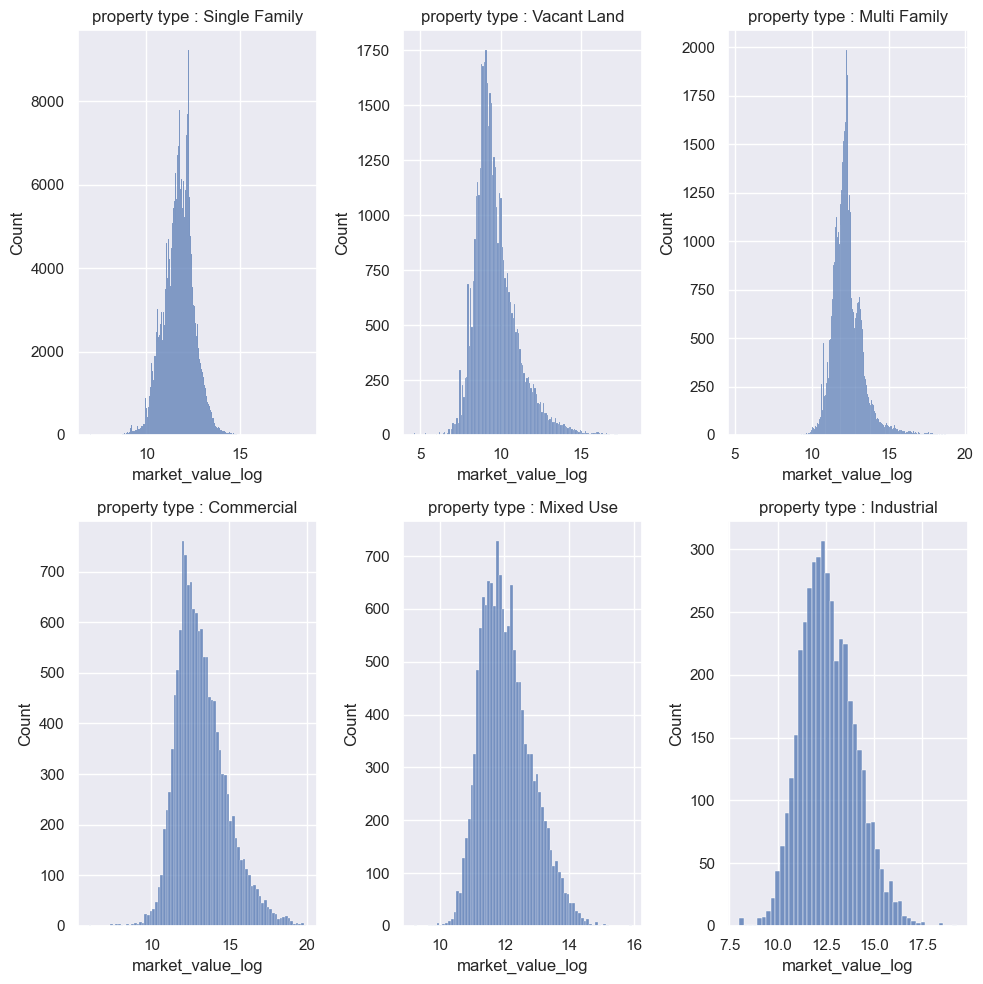

In [11]:
fig, axes = plt.subplots(2,3, figsize=(10,10))

for ax, cat in zip(axes.flatten(), df_initial['category_code_description'].unique()):
    ax.set_title(f"property type : {cat}")
    sns.histplot(ax=ax, x=np.log(df_initial[df_initial['category_code_description']==cat]['market_value']))
    ax.set_xlabel('market_value_log')

fig.tight_layout()

Selanjutnya untuk bahan analisis kita akan liat tipe properti Residentials/Single Family

In [12]:
df_res = df_initial[df_initial['category_code_description']=="Single Family"]

In [13]:
# Cek info lebih detail untuk setiap fitur untuk kategori residentials/SIngle Family
listItem = []

for col in df_res.columns:
    listItem.append([col, df_res[col].dtype, df_res[col].isna().sum()*100/len(df_res), round((df_res[col].isna().sum()/len(df_res[col]))*100, 2),
                    df_res[col].nunique(), list(df_res[col].drop_duplicates().sample(1).values)])

df_desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)

df_desc = df_desc.sort_values(by='null', ascending=False)
df_desc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
30,owner_2,object,62.853546,62.85,136357,[BARTON DIANNE D ]
9,geographic_ward,float64,1.326767,1.33,66,[55.0]
25,view_type,object,0.259331,0.26,8,[H]
11,interior_condition,float64,0.026648,0.03,8,[5.0]
31,state_code,float64,0.011266,0.01,3,[1001.0]
5,exterior_condition,float64,0.006500,0.01,8,[6.0]
18,sale_date,object,0.005200,0.01,22074,[2007-01-08 00:00:00]
28,zoning,object,0.003466,0.00,35,[RSA5 ]
14,number_of_bathrooms,float64,0.000433,0.00,16,[1.0]
26,year_built,object,0.000433,0.00,299,[2004.0]


### 2. Distribusi `market_value` (target)

In [14]:
df_res.describe().T

,count,mean,std,min,25%,50%,75%,max
category_code,461573.0,1.000000,0.000000e+00,1.0,1.00,1.0,1.00,1.0
depth,461572.0,77.814959,2.578914e+02,0.0,56.00,75.0,100.00,120883.0
exterior_condition,461543.0,3.860169,7.249635e-01,0.0,4.00,4.0,4.00,7.0
fireplaces,461571.0,0.039038,2.585353e-01,0.0,0.00,0.0,0.00,10.0
frontage,461572.0,956.599658,6.359019e+05,0.0,14.83,16.0,19.91,432026008.0
garage_spaces,461571.0,0.381792,6.757479e-01,0.0,0.00,0.0,1.00,72.0
geographic_ward,455449.0,35.154685,1.930317e+01,1.0,19.00,36.0,52.00,66.0
house_extension,461573.0,0.813717,5.385030e+00,0.0,0.00,0.0,0.00,99.0
interior_condition,461450.0,3.857423,7.291318e-01,0.0,4.00,4.0,4.00,7.0
market_value,461573.0,173642.821721,2.608471e+05,0.0,74500.00,130000.0,209600.00,117456100.0


<AxesSubplot: title={'center': '(> 1M USD)'}, xlabel='market_value', ylabel='Count'>

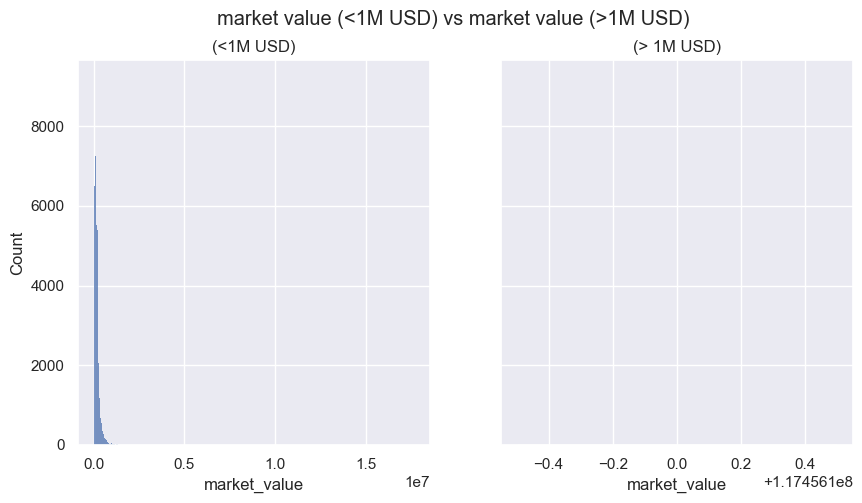

In [15]:
fig, axes = plt.subplots(1, 2, sharey=True, figsize=(10,5))
fig.suptitle('market value (<1M USD) vs market value (>1M USD)')
axes[0].set_title('(<1M USD)')
axes[1].set_title('(> 1M USD)')


#registered
sns.histplot(ax=axes[0], x=df_res[df_res['market_value']<=20000000]['market_value'])
sns.histplot(ax=axes[1], x=df_res[df_res['market_value']>20000000]['market_value'], color='orange')

<AxesSubplot: xlabel='market_value', ylabel='Count'>

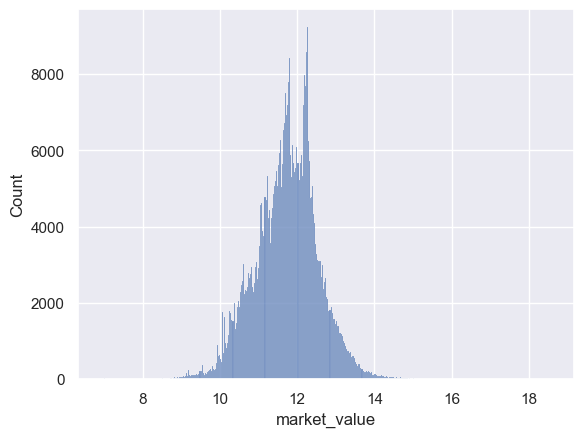

In [16]:
#market_value dalam skala logaritmik
sns.histplot(np.log(df_res['market_value']))

In [17]:
df_res[['market_value']].sort_values(by='market_value', ascending=False)

,market_value
128027,117456100.0
570654,17680000.0
563071,13596500.0
558190,12460900.0
559446,10800000.0
...,...
561136,1100.0
560928,1100.0
580401,1000.0
9425,0.0


Text(0.5, 1.0, 'Market Value distribution (boxplot)')

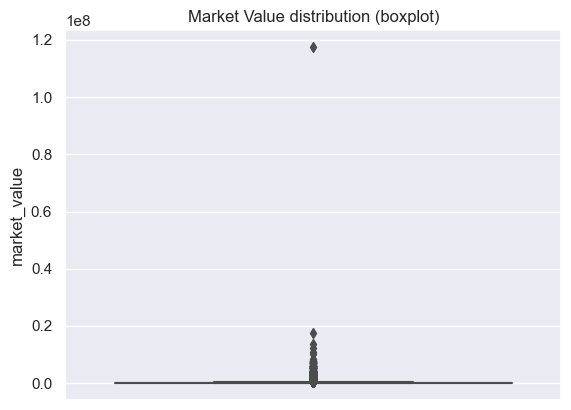

In [18]:
#cek outlier yg ekstrim
plt.figure()
sns.boxplot(y=df_res['market_value'])
plt.title("Market Value distribution (boxplot)")

Text(0.5, 1.0, 'Market Value distribution (boxplot) in logaritmic scale')

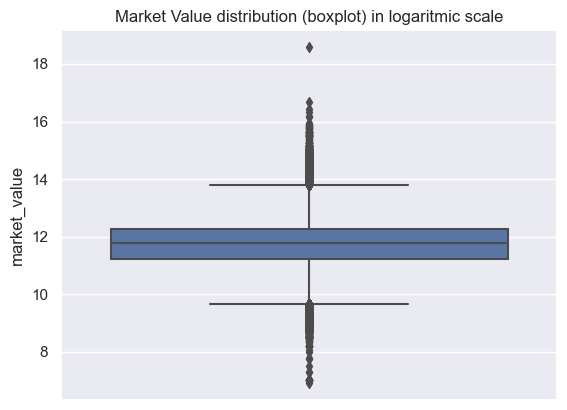

In [19]:
#market_value dalam skala logaritmik
plt.figure()
sns.boxplot(y=np.log(df_res['market_value']))
plt.title("Market Value distribution (boxplot) in logaritmic scale")

In [20]:
# di atas 20 juta dollar --> outlier ekstrim
df_res[df_res['market_value']>20000000][['market_value']]

,market_value
128027,117456100.0


Text(0.5, 1.0, 'Market Value distribution (boxplot)')

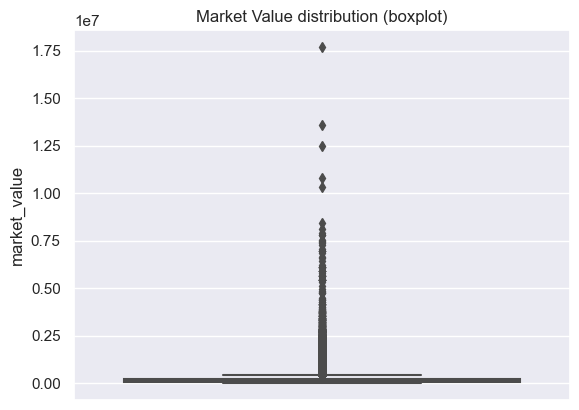

In [21]:
#coba kita drop
df_res = df_res[df_res['market_value']<20000000]

#cek sebaran market value, setelah outlier di drop
plt.figure()
sns.boxplot(y=df_res['market_value'])
plt.title("Market Value distribution (boxplot)")

In [22]:
df_res['market_value'].median()

130000.0

Dimana nilai median dari market_value properti dengan kategori "Single Family" (setelah outlier di hapus) : 130000 USD

Text(0.5, 1.0, 'Market Value distribution (boxplot) in logaritmic scale')

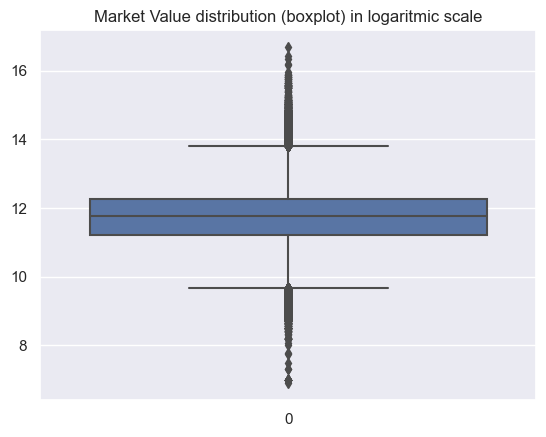

In [23]:
#market_value dalam skala logaritmik seteleah nilai di atas 20 juta USD di drop
plt.figure()
sns.boxplot(np.log(df_res['market_value']))
plt.title("Market Value distribution (boxplot) in logaritmic scale")

untuk analisis yang membutuhkan nilai log market value, kita buat kolom baru `market_value_log`


In [24]:
df_res['market_value_log'] = np.log(df_res['market_value'])

### 3. Nilai market properti berdasarkan kondisi rumah (interior dan exterior)

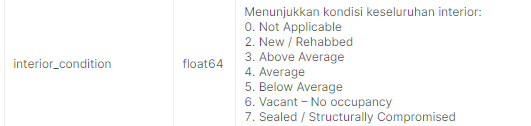

i. `interior_condition`

Text(0.5, 1.0, 'interior_condition distribution')

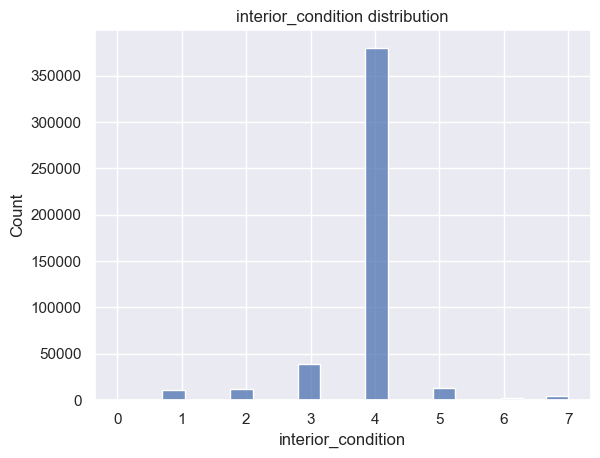

In [25]:
plt.figure()
sns.histplot(x=df_res['interior_condition'])
plt.title('interior_condition distribution')

Sebaran nya tidak seimbang, dimana kondisi average (kategori 4) paling banyak di antara yang lainnya. 

Perlu dicatat, bahwa interior_condition ini merupakan data ordinal, tapi ranknya terbalik --> makin tinggi angkanya makin jelek kondisinya

<AxesSubplot: xlabel='interior_condition', ylabel='market_value'>

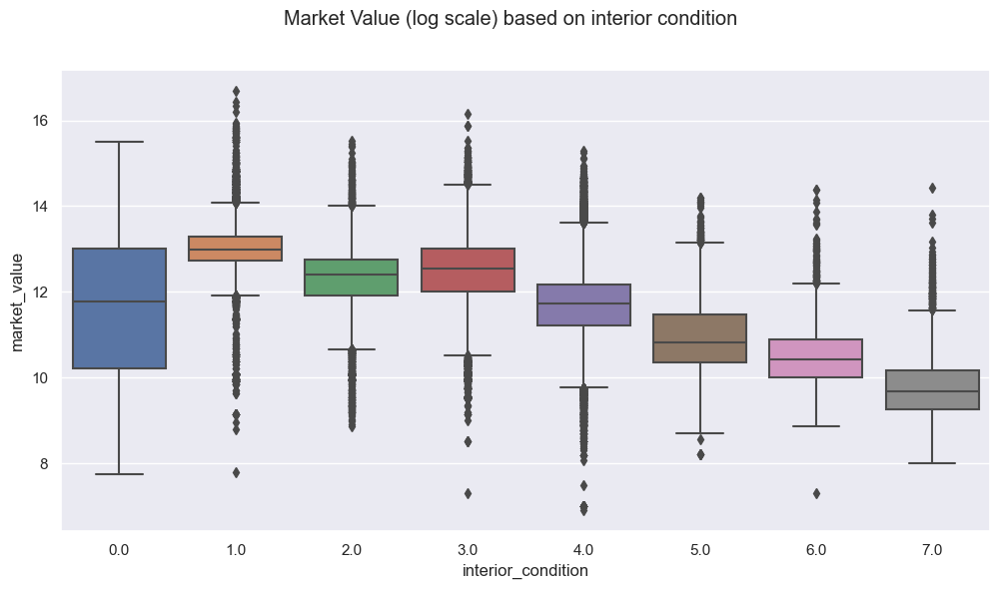

In [26]:
fig = plt.figure(figsize=(12,6))
fig.suptitle("Market Value (log scale) based on interior condition")
sns.boxplot(x=df_res['interior_condition'], y=np.log(df_res['market_value']))

In [27]:
df_res.groupby(['interior_condition'])['market_value'].mean()

interior_condition
0.0    448489.140271
1.0    549354.689219
2.0    286690.018438
3.0    355891.809450
4.0    145838.101403
5.0     79620.436010
6.0     54980.784487
7.0     27217.333623
Name: market_value, dtype: float64

ii. `exterior_condition`

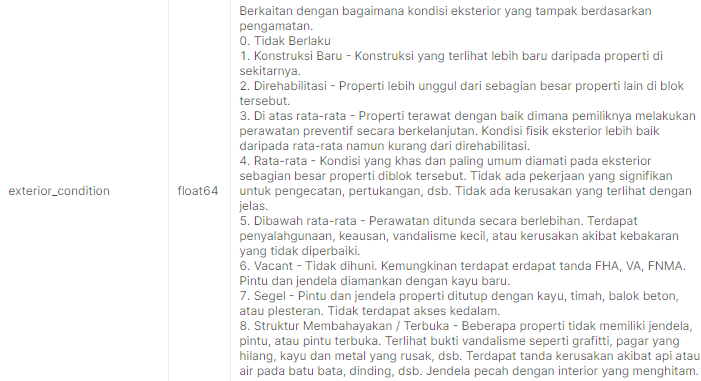

Text(0.5, 1.0, 'exterior_condition distribution')

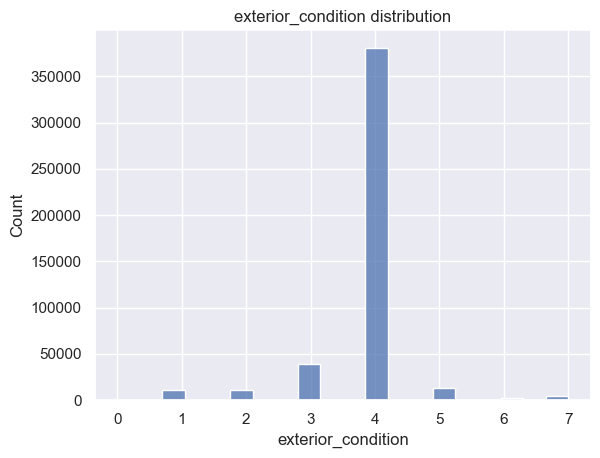

In [28]:
plt.figure()
sns.histplot(x=df_res['exterior_condition'])
plt.title('exterior_condition distribution')

Sebaran nya tidak seimbang, dimana kondisi average (kategori 4) paling banyak di antara yang lainnya. Jika kita lihat sebaran nya mirip dengan kondisi interior rumah

<AxesSubplot: xlabel='exterior_condition', ylabel='market_value'>

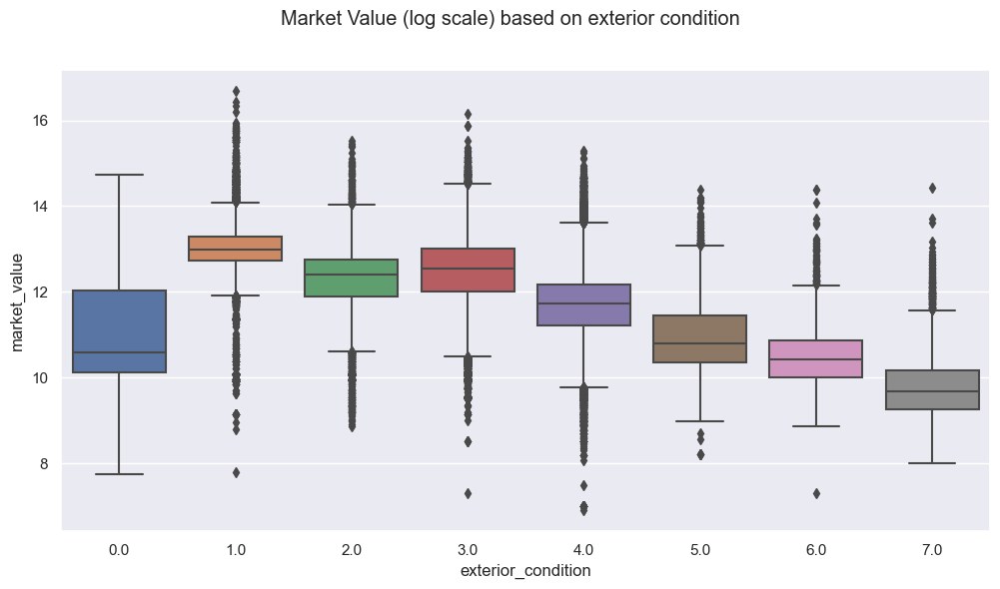

In [29]:
fig = plt.figure(figsize=(12,6))
fig.suptitle("Market Value (log scale) based on exterior condition")
sns.boxplot(x=df_res['exterior_condition'], y=np.log(df_res['market_value']))

mari kita cek, nilai interior dan exterion dengan kondisi yang sama

In [30]:
display(df_res[(df_res['interior_condition'] == df_res['exterior_condition'])][['interior_condition', 'exterior_condition']])


,interior_condition,exterior_condition
0,5.0,5.0
1,2.0,2.0
2,4.0,4.0
3,4.0,4.0
4,4.0,4.0
...,...,...
581451,4.0,4.0
581452,4.0,4.0
581453,4.0,4.0
581454,4.0,4.0


In [31]:
456212/len(df_res)

0.9883875105075698

kebanyakan kondisi interior dan eksterior properti memiliki nilai/kategori yang sama (461.572 baris atau 98.8% dari total baris)

In [32]:
display(df_res[(df_res['interior_condition'] != df_res['exterior_condition'])][['interior_condition', 'exterior_condition']])
print("nilai missing value pada kedua kolom interior dan exterior")
df_res[(df_res['interior_condition'] != df_res['exterior_condition'])][['interior_condition', 'exterior_condition']].isnull().sum()

,interior_condition,exterior_condition
265,4.0,3.0
464,4.0,3.0
910,5.0,4.0
1046,4.0,3.0
1204,4.0,3.0
...,...,...
581002,6.0,4.0
581003,6.0,4.0
581004,6.0,4.0
581005,6.0,4.0


nilai missing value pada kedua kolom interior dan exterior


interior_condition    123
exterior_condition     30
dtype: int64

Kita bisa buat fitur baru, kombinasi dari keduanya yaitu "overall_condition"

- Jika interior dan exteriornya maka nilai "overall_condition" = interior = exterior
- Jika interior dan exterior memiliki nilai yang berbeda, maka ambil saja rata-rata nya
- Hapus Jika kedua nilai kosong
- Jika salah satu kosong, pakai aja overall condition = nilai yg ga kosong

### 4. Nilai market properti berdasarkan `view_type`

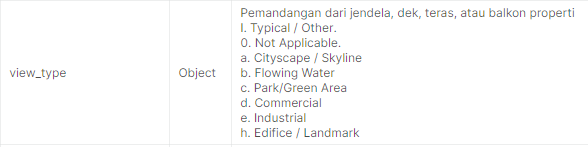

In [33]:
df_res['view_type'].value_counts()

I    428292
A     13894
C      7171
0      2965
H      2443
D      2091
E      1780
B      1739
Name: view_type, dtype: int64

<AxesSubplot: xlabel='view_type', ylabel='Count'>

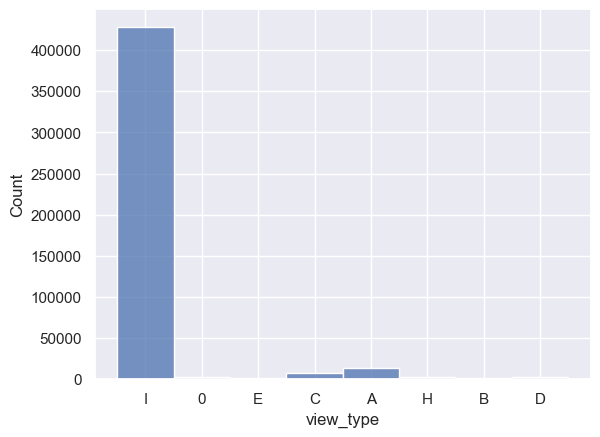

In [34]:
sns.histplot(df_res['view_type'])

sebaran fitur/kolom `view_type` sangat tidak seimbang, kemungkinan kita drop saja

<AxesSubplot: xlabel='view_type', ylabel='market_value'>

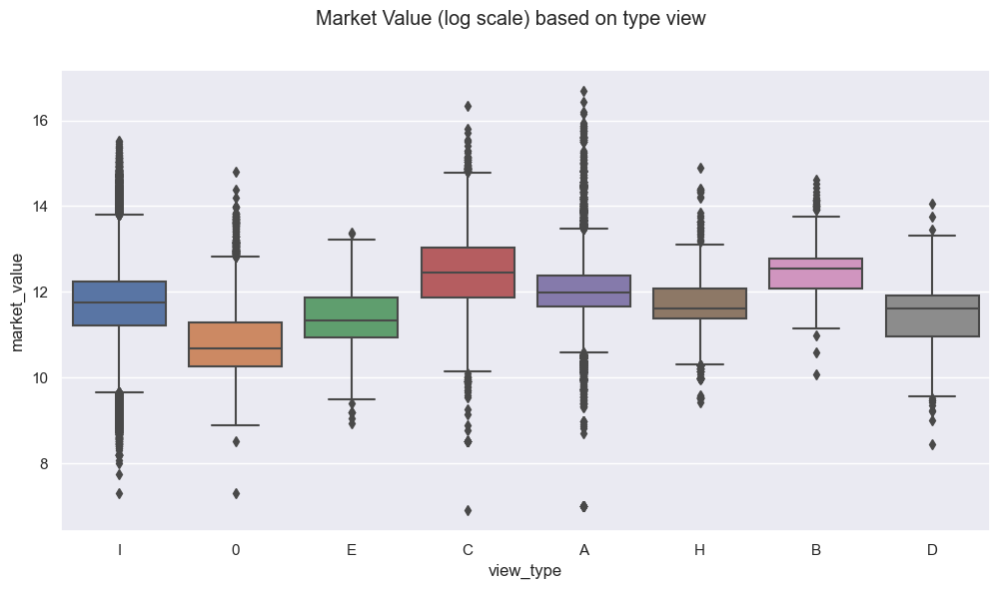

In [35]:
fig = plt.figure(figsize=(12,6))
fig.suptitle("Market Value (log scale) based on type view")
sns.boxplot(x=df_res['view_type'], y=np.log(df_res['market_value']))

Ada dua cara :

1. Kita buat dua kategori view type yaitu kategori I dan non-I
2. Tapi sepertinya ga balance, jadi kemungkinan kita drop saja

### 5. Nilai market properti berdasarkan data lokasi/geografis (`street_name`, `zoning`, `state_code`, `street_designation`, `zip_code`,`street_code`, `building_code`, `building_code_description`, `location`, `geographic_ward`)

#### i. `street_name`

In [36]:
street_df = df_res.groupby(['street_name']).size().reset_index(name='count').sort_values(by='count', ascending=False)
street_df

,street_name,count
1377,LOCUST,2760
15,18TH,2247
4,06TH,2243
0,02ND,2019
6,08TH,1885
...,...,...
339,BREWERY,1
316,BOLTON,1
177,ARMSTRONG,1
1877,RAUCH,1


In [37]:
street_mean_df = df_res.groupby(['street_name'])['market_value'].median().reset_index(name='market_value_median').sort_values(by='market_value_median', ascending=False)
street_mean_df

,street_name,market_value_median
1198,JOHN F KENNEDY,2500000.0
2418,WILLINGS,1540600.0
2133,ST PETERS,1530300.0
2248,TOWANDA,1453000.0
2354,WATERMAN,1270500.0
...,...,...
1206,JUNE,21000.0
339,BREWERY,18500.0
1968,ROY,16900.0
1528,MERION,16900.0


In [38]:
temp_df = street_df.merge(street_mean_df, how='inner').sort_values(by='market_value_median', ascending=False)
temp_df

,street_name,count,market_value_median
2481,JOHN F KENNEDY,1,2500000.0
2450,WILLINGS,3,1540600.0
2461,ST PETERS,2,1530300.0
2282,TOWANDA,11,1453000.0
2285,WATERMAN,10,1270500.0
...,...,...,...
2050,JUNE,20,21000.0
2484,BREWERY,1,18500.0
2357,ROY,7,16900.0
1324,MERION,72,16900.0


In [40]:
fig = px.scatter(temp_df, x='count', y='market_value_median', hover_data=['street_name'],
                 title='The market value (median) refers to the number of properties counted based on their respective street names.')

iplot(fig)

- Jumlah properti terbanyak ada di jalan "LOCUST" dengan jumlah 2760 rumah/properti dengan nilai median market value nya 268k USD
- Jika dilihat nilai median market properti yang di atas 1 juta USD tersebar di jalan/street dengan jumlah properti kurang dari 51 rumah
- Hanya ada 1 rumah di jalan JOHN F.KENNEDY dan memiliki nilai market yang paling tinggi yaitu mencapai 2,5juta USD

#### ii. `zoning`

Fitur ini menunjukkan apakah properti tersebut memiliki garasi atau tidak dengan keterangan

- 0 --> tidak ada garasi
- 1 --> ada garasi

In [ ]:
#train
df_train.loc[df_train['garage_spaces'] == 0,'is_there_a_garage'] = 0
df_train.loc[df_train['garage_spaces'] > 0,'is_there_a_garage'] = 1

#test
df_test.loc[df_test['garage_spaces'] == 0,'is_there_a_garage'] = 0
df_test.loc[df_test['garage_spaces'] > 0,'is_there_a_garage'] = 1

Text(0.5, 1.0, 'median market value based on there a garage or not')

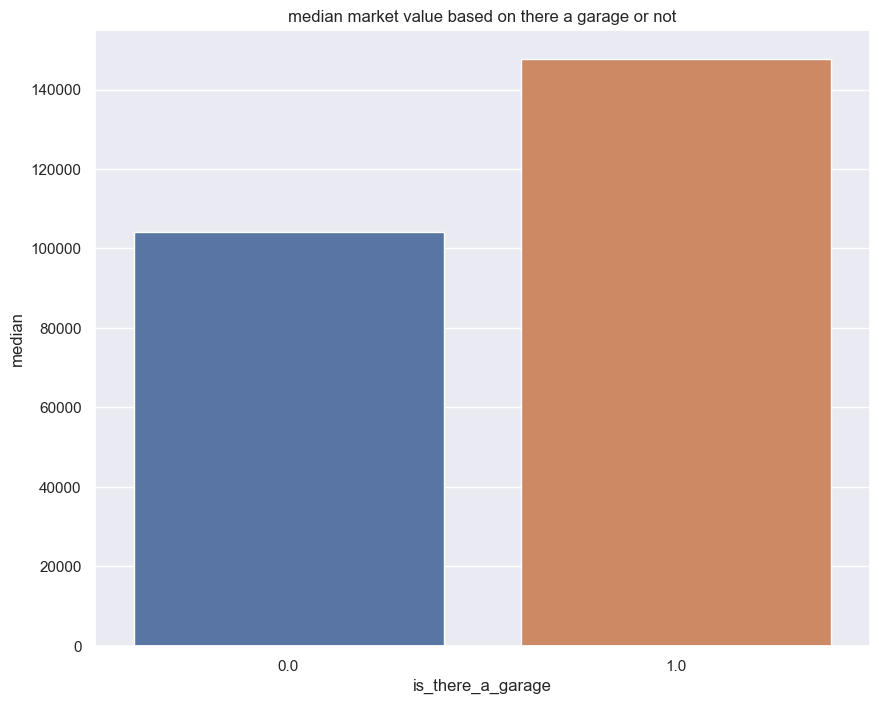

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(df_train.groupby('is_there_a_garage')['market_value'].median().reset_index(name='median'), x='is_there_a_garage', y='median')
plt.title('median market value based on there a garage or not')

properti yang memiliki garasi cenderung memiliki harga yang lebih tinggi

##### vi. `is_oneFloor`

Fitur ini menunjukkan apakah properti tersebut bertingkat atau tidak dengan keterangan

- 0 --> tidak bertingkat
- 1 --> bertingkat

In [ ]:
#train
df_train.loc[df_train['number_stories'] == 0, 'is_oneFloor'] = 0
df_train.loc[df_train['number_stories'] > 0, 'is_oneFloor'] = 1

#test
df_test.loc[df_test['number_stories'] == 0, 'is_oneFloor'] = 0
df_test.loc[df_test['number_stories'] > 0, 'is_oneFloor'] = 1

Text(0.5, 1.0, 'median market value based on one Floor or not')

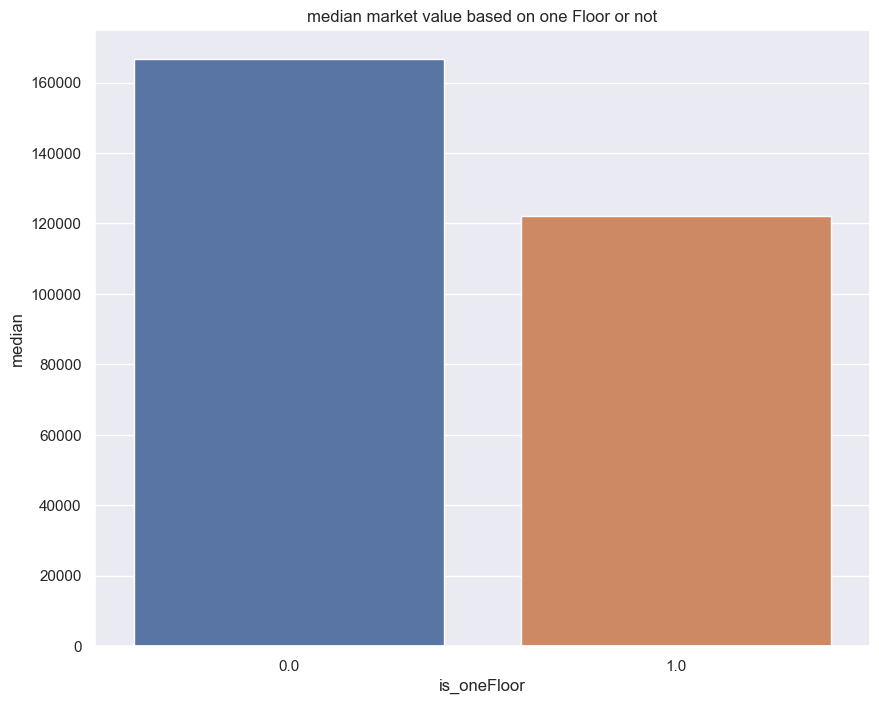

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(df_train.groupby('is_oneFloor')['market_value'].median().reset_index(name='median'), x='is_oneFloor', y='median')
plt.title('median market value based on one Floor or not')

properti yang memiliki 1 lantai (tidak bertingkat) cenderung memiliki harga yang lebih tinggi

##### vii. `is_singleOwner`

Fitur ini menunjukkan apakah properti tersebut atas nama 1 orang (pemilik tunggal) atau tidak

- 0 --> tidak pemilik tunggal
- 1 --> pemilik tunggal 

In [ ]:
#train
df_train.loc[(df_train['owner_1']==df_train['owner_2']), 'is_singleOwner'] = 1
df_train.loc[(df_train['owner_1']!=df_train['owner_2']), 'is_singleOwner'] = 0

#test
df_test.loc[(df_test['owner_1']==df_test['owner_2']), 'is_singleOwner'] = 1
df_test.loc[(df_test['owner_1']!=df_test['owner_2']), 'is_singleOwner'] = 0

Text(0.5, 1.0, 'median market value based on single Owner or not')

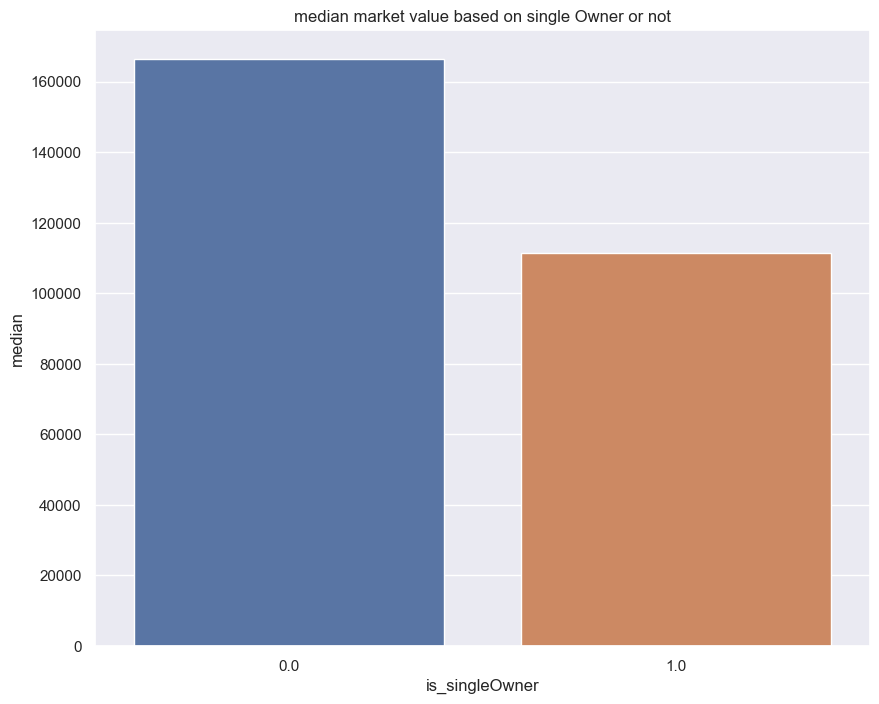

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(df_train.groupby('is_singleOwner')['market_value'].median().reset_index(name='median'), x='is_singleOwner', y='median')
plt.title('median market value based on single Owner or not')

properti yang memiliki dua nama pemilik (tidak tunggal) cenderung nilai market nya lebih tinggi

### 3. Drop Columns

In [ ]:
columns_to_drop = ['sale_year', 'year_built', 'garage_spaces', 'sale_date', 
                   'street_name', 'owner_1', 'owner_2', 'exterior_condition', 
                    'interior_condition', 'number_stories']

In [ ]:
df_train = df_train.drop(columns_to_drop, axis=1)
df_test = df_test.drop(columns_to_drop, axis=1)

### Data akhir (Data yang sudah "bersih")

In [ ]:
# Cek info lebih detail untuk setiap fitur untuk data yang sudah bersih (data train)
listItem = []

for col in df_train.columns:
    listItem.append([col, df_train[col].dtype, df_train[col].isna().sum(), round((df_train[col].isna().sum()/len(df_train[col]))*100, 2),
                    df_train[col].nunique(), list(df_train[col].drop_duplicates().sample(2).values)])

df_train_desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)

df_train_desc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,depth,float64,0,0.0,12841,"[170.53, 55.55]"
1,frontage,float64,0,0.0,5887,"[37.15, 39.98]"
2,number_of_bathrooms,float64,0,0.0,4,"[0.0, 3.0]"
3,number_of_bedrooms,float64,0,0.0,6,"[5.0, 1.0]"
4,number_of_rooms,float64,0,0.0,10,"[1.0, 8.0]"
5,total_area,float64,0,0.0,62156,"[4811.28, 1832.54]"
6,total_livable_area,float64,0,0.0,3159,"[3394.0, 1827.0]"
7,market_value,float64,0,0.0,8824,"[449100.0, 480400.0]"
8,region,object,0,0.0,7,"[center_city, northwest]"
9,sale_quarter,int64,0,0.0,4,"[2, 1]"


In [ ]:
## Berikut nilai median market value properti pada data train :
df_train['market_value'].median()

127200.0

In [ ]:
print('ukuran data awal/mentah (semua kategori properti) : ', df_raw.shape)
print('ukuran data awal/mentah (hanya kategori single family/residentials) : ', df_raw[df_raw['category_code_description']=='Single Family'].shape)

ukuran data awal/mentah (semua kategori properti) :  (581456, 75)
ukuran data awal/mentah (hanya kategori single family/residentials) :  (461573, 75)


In [ ]:
print('ukuran data yang bersih yang akan kita gunakan dalam pemodelan')
print('train data :', df_train.shape)
print('test data :', df_test.shape)
print('total data yang bersih : ', df_train.shape[0] + df_test.shape[0])

ukuran data yang bersih yang akan kita gunakan dalam pemodelan
train data : (353161, 18)
test data : (88617, 18)
total data yang bersih :  441778


Sekali lagi kita cek rentang harga properti yang akan kita gunakan untuk melatih model

In [ ]:
print("Nilai tertinggi market value :", df_train['market_value'].max())
print("Nilai terendah market value :", df_train['market_value'].min())

Nilai tertinggi market value : 4160000.0
Nilai terendah market value : 1000.0


- Perlu dicatat kembali, data properti yang kita gunakan hanya dari kategori single family/residentials
- Di terakhir, data yang akan kita gunakan di pemodelan (data bersih) ada 441778 baris dari total 461573 baris awal (kategori single family), atau sekitar 4.2 % baris yang kami drop sesuai dengan asumsi, batasan data yang disampaikan di proses EDA dan Preprocessing. 
- Selain itu dari feature engineering kami membuat atau mengekstrak 10 fitur baru yaitu 
New Features :  `property_age`, `sale_quarter`, `new_zoning`, `overall_condition`, `year_sale_built_gap`, `total_rooms`, 
                `is_there_a_garage`, `is_oneFloor`, `is_singleOwner`, `region`

Selain itu sebagai catatan juga, kami merangkum beberapa batasan data yang kita gunakan dalam pemodelan kali ini (dari hasil EDA dan preproceesing) :

- Harga market value pada rentang 1,000 USD - 4,160,000 USD dengan kategori Single Family/Residentials di kota Philadelpia
- Tahun dijual properti >= 1944. Alasannya karena fluktuasi harga yang tinggi pada rentang tahun < 1944 (tepatnya 1920-1944) dan juga karena efek PD1 dan PD2 (anomali)
- Tahun dibangun/dibuat dari properti tersebut harus lebih besar dari nol (> 0)
- Kami hanya menggunakan data properti yang dimana bangunan nya ada dulu baru dijual (atau year sale > year built nya)
- Total luas tanah pada rentang 0-12600 sqft atau 0-1170.5 m2
- Total luas bangunan/properti pada rentang 0-3883 sqft atau 0-360.7 m2
- Ketinggian tanah properti dari jalan (fitur depth) pada rentang 0-218 ft  atau 0-66 meter
- Jarak halaman depan dengan batas jalan pada rentang 0- 119ft atau 36 meter
- Jumlah kamar, kamar tidur, dan kamar mandi masing-masing pada rentang 0-7 kamar, 0-5 kamar tidur, dan 0-3 kamar mandi

# MODELING

In [ ]:
# Import library untuk modeling
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, KFold, HalvingRandomSearchCV

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from xgboost.sklearn import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.compose import TransformedTargetRegressor

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error, make_scorer

### Data Transformation --> Scaling (numeric) and encoding (category)

Agar dapat menggunakan semua fitur yang dipilih, maka fitur-fitur kategorikal harus diubah menjadi fitur numerikal. Kita dapat menggunakan ColumnTransformer untuk dapat mengubah tipe datanya (untuk data kategori), yang mana nanti dapat diaplikasikan pada pipeline model. Sedangkan untuk data numerik saya akan lakukan scaling dengan standard scaler

In [ ]:
#Data Numerik
numeric_features = ['depth', 'frontage', 'number_of_bathrooms', 'number_of_bedrooms', 'number_of_rooms',
                        'total_area', 'total_livable_area', 'property_age', 'year_sale_built_gap', 
                        'total_rooms', 'overall_condition']


#Data Kategori
# Mengubah fitur kategorikal menjadi numerikal dan standard scaler untuk fitur numerical
transformer = ColumnTransformer([
    ('scaler', StandardScaler(), numeric_features),
    ('one hot', OneHotEncoder(sparse=False), ['sale_quarter', 'is_there_a_garage', 'is_oneFloor', 'is_singleOwner', 'new_zoning']),
    ('binary', ce.BinaryEncoder(return_df=True), ['region'])
], remainder='passthrough')


### Data Train and Test

In [ ]:
#train
X_train = df_train.drop(['market_value'], axis=1)
y_train = df_train['market_value']

#test
X_test = df_test.drop(['market_value'], axis=1)
y_test = df_test['market_value']

### Models Comparison

In [ ]:
# Define algoritma yang digunakan
# lr = LinearRegression()
# knn = KNeighborsRegressor()
# sgd = SGDRegressor(random_state=1)
# svr = SVR(kernel='rbf')
# lasso = Lasso(random_state=1)
# dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)
lgbm = LGBMRegressor(random_state=1)
# mlp = MLPRegressor(random_state=1, max_iter=500)


# Pemodelan dilakukan dalam skala logaritmik, namun kemudian di-inverse kembali untuk interpretasi
# log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
# log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
# log_sgd = TransformedTargetRegressor(sgd, func=np.log, inverse_func=np.exp)
# log_svr = TransformedTargetRegressor(svr, func=np.log, inverse_func=np.exp)
# log_lasso = TransformedTargetRegressor(lasso, func=np.log, inverse_func=np.exp)
# log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)
log_lgbm = TransformedTargetRegressor(lgbm, func=np.log, inverse_func=np.exp)
# log_mlp= TransformedTargetRegressor(mlp, func=np.log, inverse_func=np.exp)


# Kandidat algoritma
models = [log_rf, log_xgb, log_lgbm]

def model_benchmarking (models, X, y) : 
    score_r2 = []
    nilai_mean_r2 = []
    nilai_std_r2 = []

    score_mae = []
    nilai_mean_mae = []
    nilai_std_mae = []

    score_mape = []
    nilai_mean_mape = []
    nilai_std_mape = []

    score_rmsle = []
    nilai_mean_rmsle = []
    nilai_std_rmsle = []

    cv_duration = []

    # Mencari algoritma terbaik berdasarkan tiap metrics
    for i in models:

        #time
        start_time = time.time() 
        
        crossval = KFold(n_splits=5, shuffle=True, random_state=1)
            

        estimator = Pipeline([
            ('preprocessing', transformer),
            ('model', i)
        ])

        #R Squared
        model_cv_r2 = cross_val_score(
            estimator, 
            X, 
            y, 
            cv=crossval, 
            scoring='r2', 
            error_score='raise'
            )

        print(model_cv_r2, i)

        score_r2.append(model_cv_r2)
        nilai_mean_r2.append(model_cv_r2.mean())
        nilai_std_r2.append(model_cv_r2.std())

        # MAE
        model_cv_mae = cross_val_score(
            estimator, 
            X, 
            y, 
            cv=crossval, 
            scoring='neg_mean_absolute_error', 
            error_score='raise'
            )

        print(model_cv_mae, i)

        score_mae.append(model_cv_mae)
        nilai_mean_mae.append(model_cv_mae.mean())
        nilai_std_mae.append(model_cv_mae.std())

        # MAPE
        model_cv_mape = cross_val_score(
            estimator, 
            X, 
            y, 
            cv=crossval, 
            scoring='neg_mean_absolute_percentage_error', 
            error_score='raise'
            )

        print(model_cv_mape, i)

        score_mape.append(model_cv_mape)
        nilai_mean_mape.append(model_cv_mape.mean())
        nilai_std_mape.append(model_cv_mape.std())

        # RMSLE

        scoring=make_scorer(mean_squared_log_error, greater_is_better=False, squared=False)
        
        model_cv_rmsle = cross_val_score(
            estimator, 
            X, 
            y, 
            cv=crossval, 
            scoring=scoring, 
            error_score='raise'
            )
        
        score_rmsle.append(model_cv_rmsle)
        nilai_mean_rmsle.append(model_cv_rmsle.mean())
        nilai_std_rmsle.append(model_cv_rmsle.std())

        duration = time.time() - start_time
        duration_min = duration/60
        cv_duration.append(duration_min)

    # Evaluasi hasil dari 5 kandidat algoritma yang digunakan
    hasil_benchmark_df = pd.DataFrame({'Model': ['RandomForest Regressor', 'XGBoost Regressor', 'LGBM Regressor'],
                                        'Mean_MAE': nilai_mean_mae,
                                        'Std_MAE': nilai_std_mae,
                                        'Mean_MAPE': nilai_mean_mape,
                                        'Std_MAPE': nilai_std_mape,
                                        'Mean_RMSLE': nilai_mean_rmsle,
                                        'Std_RMSLE': nilai_std_rmsle,   
                                        'Mean_R-Squared': nilai_mean_r2,
                                        'Std_R-Squared': nilai_std_r2,
                                        'cv duration (minutes)' : cv_duration
})
    return hasil_benchmark_df

In [ ]:
display(model_benchmarking(models, X_train, y_train))
print("Hasil Model Benchmarking ")

[0.89382324 0.88879785 0.89363453 0.87221225 0.8904895 ] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=RandomForestRegressor(random_state=1))
[-19396.80637902 -19297.97876311 -19287.61664354 -20334.33766009
 -19298.96906067] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=RandomForestRegressor(random_state=1))
[-0.13636277 -0.13572535 -0.13225407 -0.13814839 -0.13439759] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=RandomForestRegressor(random_state=1))
[0.83385595 0.83317761 0.83341821 0.82362872 0.83122078] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=XGBRegressor(base_score=None, booster=None,
                                                  callbacks=None,
                                                  colsample_byleve

,Model,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE,Mean_RMSLE,Std_RMSLE,Mean_R-Squared,Std_R-Squared,cv duration (minutes)
0,RandomForest Regressor,-19523.141701,407.534850,-0.135378,0.001974,-0.251589,0.003460,0.887791,0.008019,56.678306
1,XGBoost Regressor,-30867.305234,192.172436,-0.227556,0.001496,-0.316739,0.001408,0.831060,0.003824,2.357592
2,LGBM Regressor,-33859.142211,242.295018,-0.250618,0.001780,-0.339415,0.002176,0.795538,0.003642,0.452971


Hasil Model Benchmarking 


Dari hasil Model Benchmarking di atas, dilihat dari semua metrics yang ada maka Model dengan algoritma Random Forest memiliki nilai error yang paling rendah. Tapi kelemahan dari Random Forest adalah waktu/durasi untuk training nya cukup lama jika dibandingkan dengan XGBoost dan LGBM.

Selain itu dari hasil MAPE yang didapatkan bisa dibilang cukup rendah pada ketiga model ini, yang menandakan nilai prediksi yang lebih tinggi jika dibandingkan nilai aktual (overestimation) dapat di handel dengan cukup baik pada prediksi registered users, karea MAPE sensitif terhadap nilai prediksi yang overestimated. Sedangkan untuk RMSLE nya juga nilainya cukup kecil, yang artinya nilai prediksi yang lebih rendah dari nilai aktual nya (underestimation) dapat di handel dengan cukup baik juga, dimana RSMLE sensitif terhadap error pada nilai prediksi yang underestimated.

**Penjelasan singkat mengenai model random forest**

![randomForest_diagram](assets/rf_diagram.png)

Model Random Forest adalah sebuah metode ensemble learning yang terdiri dari beberapa pohon keputusan (decision trees). Cara kerja model Random Forest dapat dijelaskan sebagai berikut:

Pemilihan sampel acak: Model Random Forest menggunakan teknik bootstrap sampling, yaitu mengambil sampel secara acak dengan penggantian dari dataset pelatihan. Setiap pohon yang akan dibangun akan menggunakan sampel yang berbeda dari dataset.

Pembangunan pohon keputusan: Untuk setiap pohon dalam Random Forest, pemilihan fitur dilakukan secara acak dengan mempertimbangkan subset fitur yang akan digunakan dalam membangun pohon tersebut. Hal ini membantu dalam mengurangi korelasi antara pohon-pohon dalam ensemble.

Proses pembangunan pohon: Pada setiap pohon, pemilihan fitur terbaik dilakukan dengan menggunakan metode seperti Gini Index atau Information Gain. Proses ini dilakukan dengan membagi dataset menjadi dua atau lebih subset berdasarkan fitur-fitur yang dipilih.

Penggabungan hasil prediksi: Setelah semua pohon selesai dibangun, hasil prediksi dari setiap pohon dikumpulkan. Dalam klasifikasi, prediksi akhir dapat diambil berdasarkan mayoritas suara (mode) dari hasil prediksi pohon-pohon tersebut. Dalam regresi, prediksi akhir dapat diambil berdasarkan rata-rata dari hasil prediksi pohon-pohon tersebut.

Keuntungan dari model Random Forest adalah sebagai berikut:
- Mampu mengatasi overfitting karena penggunaan bootstrap sampling dan pemilihan fitur acak.
- Mampu menangani dataset dengan fitur yang banyak dan beragam.
- Mampu memberikan estimasi pentingnya setiap fitur dalam prediksi.
- Mampu menghasilkan prediksi yang stabil dan akurat.

Meskipun model Random Forest memiliki banyak keuntungan, ada beberapa kekurangan yang perlu diperhatikan, terutama pada penggunaan model Random Forest Regressor. Beberapa kekurangan tersebut antara lain:


- Overfitting: Meskipun model Random Forest cenderung mengurangi risiko overfitting, namun dengan menggunakan banyak pohon keputusan, terdapat kemungkinan terjadinya overfitting terutama jika parameter tidak diatur dengan baik. Jika terlalu banyak pohon digunakan, model dapat menjadi terlalu adaptif terhadap data pelatihan dan kehilangan kemampuan untuk menggeneralisasi pada data baru.

- Komputasi yang intensif: Random Forest melibatkan pembangunan banyak pohon keputusan secara paralel. Hal ini dapat membuat model memerlukan waktu dan sumber daya komputasi yang lebih besar, terutama jika dataset sangat besar dan memiliki banyak fitur.

- Sensitif terhadap data yang tidak seimbang: Jika terdapat ketidakseimbangan antara kelas atau nilai target pada dataset, Random Forest cenderung memberikan bobot yang lebih besar kepada kelas mayoritas atau nilai target yang dominan. Hal ini dapat menyebabkan hasil prediksi yang bias atau tidak akurat untuk kelas minoritas atau nilai target yang jarang.

- Sulit dalam menangani data yang hilang: Jika terdapat nilai yang hilang dalam dataset, Random Forest tidak secara otomatis menangani data yang hilang. Anda perlu melakukan pengelolaan data hilang terlebih dahulu sebelum menggunakan model ini.

### **Predict to Test Set with the Benchmark Model**

Prediksi pada test set dengan menggunakan model terbaik yaitu Random Forest

In [ ]:
# Benchmark model terbaik pada data tes
models = {
    'RandomForest': TransformedTargetRegressor(RandomForestRegressor(random_state=1), func=np.log, inverse_func=np.exp),
}

In [ ]:
def model_testing (models, train_X, train_y, test_X, test_y) :
    score_r2 = []
    score_mae = []
    score_mape = []
    score_rmsle = []

    list_of_pred = []

    # Prediksi pada test set
    for i in models:

        estimator = Pipeline([
            ('preprocessing', transformer),
            ('model', models[i])
            ])

        estimator.fit(train_X, train_y)
        y_pred = estimator.predict(test_X)
        
        score_r2.append(r2_score(test_y, y_pred))
        score_mae.append(mean_absolute_error(test_y, y_pred))
        score_mape.append(mean_absolute_percentage_error(test_y, y_pred))
        score_rmsle.append(mean_squared_log_error(test_y, y_pred, squared=False))

        list_of_pred.append(y_pred)

    score_before_tuning = pd.DataFrame({'MAE': score_mae, 'MAPE' : score_mape, 'RMSLE' : score_rmsle, 'R-Squared' : score_r2}, index=models.keys())
    
    return list_of_pred, score_before_tuning, estimator


In [ ]:
print("Testing model terbaik : Random Forest")
y_pred, score_before_tuning, rf_estimator = model_testing(models, X_train, y_train, X_test, y_test)
display(score_before_tuning)

Testing model terbaik : Random Forest


,MAE,MAPE,RMSLE,R-Squared
RandomForest,18477.787979,0.127264,0.243796,0.89205


Ketika dilakukan prediksi pada test set, performa Random Forest secara akumulatif sedikit lebih baik dari hasil benchmarking dengan cross validation sebelumnya. Hal ini menjadi salah satu dugaan, bahwa model yang kita miliki tidak underfit ataupun overfit (harus dilakukan pengecekan yang lebih mendalam lagi)

### **FEATURE IMPORTANCES**

Selanjutnya saya akan melakukan feature selection dengan metode pengurangan fitur berdasarkan nilai feature importance dari model terbaik, yaitu model Random Forest

In [ ]:
rf_model = Pipeline([
            ('preprocessing', transformer),
            ('model', models['RandomForest'])
            ])

In [ ]:
#Registered
num_cols = rf_model['preprocessing'].named_transformers_['scaler'].get_feature_names_out().tolist()
onehot_features = rf_model['preprocessing'].named_transformers_['one hot'].get_feature_names_out().tolist()
binary_features = rf_model['preprocessing'].named_transformers_['binary'].get_feature_names()

feature_names = num_cols + onehot_features + binary_features 

feature_imp = pd.DataFrame({"feature" : feature_names, "importance" : rf_model['model'].regressor_.feature_importances_}).sort_values(by='importance', ascending=False)
feature_imp['importance'] = feature_imp['importance'] / feature_imp['importance'].max()

<AxesSubplot: xlabel='importance', ylabel='feature'>

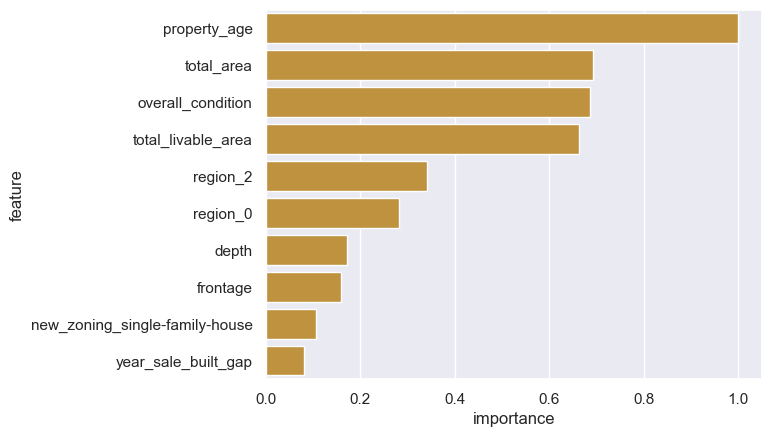

In [ ]:
sns.barplot(data=feature_imp.head(10), x='importance', y='feature', color='orange', saturation=0.5)

<AxesSubplot: xlabel='importance', ylabel='feature'>

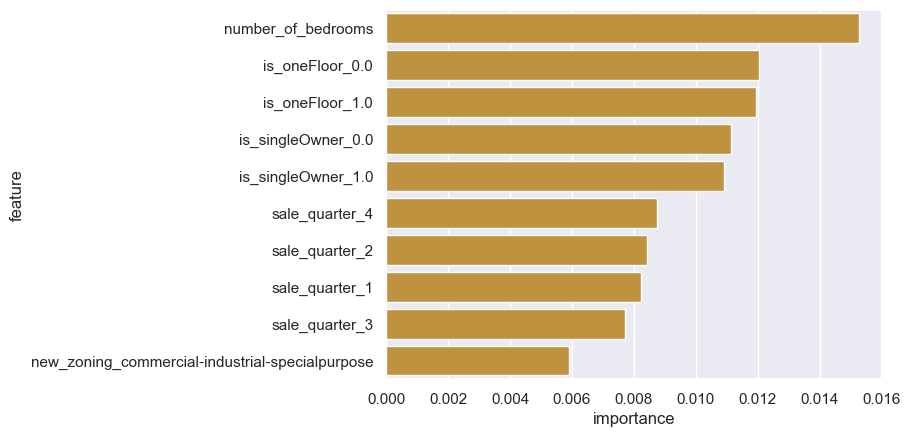

In [ ]:
sns.barplot(data=feature_imp.tail(10), x='importance', y='feature', color='orange', saturation=0.5)

Dilihat dari grafik di atas, kita dapat mengambil beberapa poin :

- 5 fitur terbaik yaitu `property_age`, `total_area`, `overall_condition`, `total_livable_area` dan `region`. Sesuai dengan pengetahuan umum bahwa kelima fitur ini akan cenderung memiliki pengaruh yang signifikan untuk pemodelan
- Sedangkan untuk fitur terendah yaitu `sale_quarter`, `is_oneFloor` dan `is_singleOwner`

Selanjutnya mari kita coba kita drop fitur : sale_quarter, is_oneFloor dan is_SingleOwner. Lalu kita train ulang model kita

In [ ]:
#Data Numerik
numeric_features = ['depth', 'frontage', 'number_of_bathrooms', 'number_of_bedrooms', 'number_of_rooms',
                        'total_area', 'total_livable_area', 'property_age', 'year_sale_built_gap', 
                        'total_rooms', 'overall_condition']


#Data Kategori
# Mengubah fitur kategorikal menjadi numerikal dan standard scaler untuk fitur numerical
transformer = ColumnTransformer([
    ('scaler', StandardScaler(), numeric_features),
    ('one hot', OneHotEncoder(sparse=False), ['is_there_a_garage', 'new_zoning']),
    ('binary', ce.BinaryEncoder(return_df=True), ['region'])
], remainder='passthrough')

In [ ]:
#train
X_train_new = df_train.drop(['market_value', 'sale_quarter', 'is_oneFloor', 'is_singleOwner'], axis=1)
y_train_new = df_train['market_value']

#test
X_test_new = df_test.drop(['market_value', 'sale_quarter', 'is_oneFloor', 'is_singleOwner'], axis=1)
y_test_new = df_test['market_value']

In [ ]:
print("Testing model terbaik Sebelum fitur di drop")
display(score_before_tuning)

Testing model terbaik Sebelum fitur di drop


,MAE,MAPE,RMSLE,R-Squared
RandomForest,18477.787979,0.127264,0.243796,0.89205


In [ ]:
print("Testing model terbaik setelah fitur sale_quarter, is_oneFloor dan is_SingleOwner di drop ")
y_pred_new, score_before_tuning_new, rf_estimator_new = model_testing(models, X_train_new, y_train_new, X_test_new, y_test_new)
display(score_before_tuning_new)

Testing model terbaik setelah fitur sale_quarter, is_oneFloor dan is_SingleOwner di drop 


,MAE,MAPE,RMSLE,R-Squared
RandomForest,17794.461094,0.122322,0.240366,0.894169


Dari kedua tabel di atas dapat kita lihat, dengan menghapus fitur sale_quarter, is_oneFloor dan is_SingleOwner didapatkan nilai error yang lebih rendah walaupun tidak terlalu besar.

selain meningkatkan performa model, Tapi ada beberapa keuntungan kita melakukan seleksi fitur atau mengurangi jumlah fitur :

- **Mempercepat waktu pelatihan dan prediksi** : Dengan mengurangi jumlah fitur yang digunakan, seleksi fitur dapat mengurangi kompleksitas model dan mengurangi waktu yang diperlukan untuk melatih model. Selain itu, saat menggunakan model yang sudah dilatih untuk membuat prediksi pada data baru, penggunaan fitur yang lebih sedikit dapat mempercepat waktu prediksi.

- **Mengurangi overfitting** : Overfitting terjadi ketika model terlalu kompleks dan dapat "menghafal" data pelatihan tanpa mampu melakukan generalisasi pada data baru. Seleksi fitur dapat membantu mengurangi overfitting dengan mempertahankan fitur-fitur yang paling penting dan menghilangkan fitur-fitur yang dapat mempengaruhi model menjadi terlalu spesifik terhadap data pelatihan.

- **Meningkatkan interpretabilitas**: Dengan menggunakan fitur-fitur yang lebih sedikit dan lebih informatif, model yang dihasilkan menjadi lebih mudah diinterpretasikan. Ini membantu dalam pemahaman dan penjelasan hasil prediksi kepada pengguna atau pemangku kepentingan.

- **Mengurangi kompleksitas dan biaya** : Dengan menghilangkan fitur-fitur yang tidak penting, seleksi fitur dapat mengurangi kompleksitas model secara keseluruhan. Hal ini dapat mengurangi biaya pengumpulan, penyimpanan, dan pemrosesan data, terutama ketika berurusan dengan data yang sangat besar.

Selanjutnya kita akan melakukan tuning parameter pada model terbaik yaitu Random Forest

### **Hyperparameter Tuning**

Mari kita cek parameter default dari model kita sebelum di tuning

In [ ]:
models['RandomForest'].get_params()

{'check_inverse': True,
 'func': <ufunc 'log'>,
 'inverse_func': <ufunc 'exp'>,
 'regressor__bootstrap': True,
 'regressor__ccp_alpha': 0.0,
 'regressor__criterion': 'squared_error',
 'regressor__max_depth': None,
 'regressor__max_features': 1.0,
 'regressor__max_leaf_nodes': None,
 'regressor__max_samples': None,
 'regressor__min_impurity_decrease': 0.0,
 'regressor__min_samples_leaf': 1,
 'regressor__min_samples_split': 2,
 'regressor__min_weight_fraction_leaf': 0.0,
 'regressor__n_estimators': 100,
 'regressor__n_jobs': None,
 'regressor__oob_score': False,
 'regressor__random_state': 1,
 'regressor__verbose': 0,
 'regressor__warm_start': False,
 'regressor': RandomForestRegressor(random_state=1),
 'transformer': None}

Hyperparameter Random forest yang akan cari nilai optimalnya adalah (kita ambil 6 ini saja yang mayoritas biasanya mempengaruhi performa model dari referenso kaggle, medium dll) :

- Jumlah pohon (n_estimators): Jumlah pohon yang akan dibangun dalam model. Hyperparameter ini biasanya disebut sebagai "n_estimators". Jumlah pohon yang lebih besar cenderung meningkatkan performa model, tetapi juga memerlukan waktu pelatihan yang lebih lama.

- Kedalaman maksimum pohon (max_depth): Hyperparameter ini menentukan kedalaman maksimum setiap pohon dalam model. Kedalaman yang lebih besar dapat memungkinkan model untuk mempelajari pola yang lebih kompleks, tetapi juga meningkatkan risiko overfitting.

- Jumlah fitur yang dipertimbangkan saat mencari pemisah terbaik (max_features): Hyperparameter ini disebut sebagai "max_features" dan menentukan jumlah fitur yang dipertimbangkan saat membagi simpul dalam pohon. Memilih jumlah fitur yang lebih kecil dapat mengurangi varian dan meningkatkan kebisingan.

- Jumlah sampel minimum yang diperlukan untuk membagi simpul (min_samples_split): Hyperparameter ini disebut sebagai "min_samples_split" dan menentukan jumlah minimum sampel yang diperlukan untuk membagi simpul dalam pohon. Mengatur jumlah minimum yang lebih tinggi dapat mengurangi risiko overfitting.

- Jumlah sampel minimum di leaf node (min_sample_leaf): Hyperparameter ini disebut sebagai "min_samples_leaf" dan menentukan jumlah minimum sampel yang diperlukan untuk membentuk leaf node dalam pohon. Mengatur jumlah minimum yang lebih tinggi dapat mengurangi risiko overfitting dan menghasilkan model yang lebih umum.

- Bootstrap : Bootstrap adalah teknik pengambilan sampel dengan penggantian dari dataset pelatihan yang tersedia.

Dalam memilih hyperparamter space, sebenernya menggunakan trial and error pada space pertama. Berikut space yang pertama

In [ ]:
# Hyperparam space versi pertama untuk Random forest
rf_params = {
            'model__regressor__max_depth': [5,10,20,30,40,50,70,80,90],
            'model__regressor__min_samples_leaf': range(1,10,1),
            'model__regressor__min_samples_split': range(2,10,1),
            'model__regressor__n_estimators': range(100,1000,10),
            'model__regressor__max_features': ['auto', 'sqrt', 'log2'],
            'model__regressor__bootstrap': [True, False],
            }

Setelah melakukan pencarian parameter terbaik, kami mendapati bahwa model kami mulai menunjukkan peningkatan performa (penurunan error) pada parameter berikut :

{'model__regressor__n_estimators': 1000, 'model__regressor__min_samples_split': 2, 'model__regressor__min_samples_leaf': 1, 'model__regressor__max_features': 'auto', 'model__regressor__max_depth': 80, 'model__regressor__bootstrap': True

Dengan ini akan mempersempit pencarian parameter space pada rentang nilai-nilai ini

**keterangan : log/histori untuk pencarian parameter terhapus dan lupa untuk disimpan, jadi hanya bisa ditampilkan parameter nya saja

In [ ]:
# Hyperparam space versi dua Random Forest
rf_params = {
            'model__regressor__max_depth': [80],
            'model__regressor__n_estimators': [1200],
            'model__regressor__min_samples_leaf': [1],
            'model__regressor__min_samples_split': [3],
            'model__regressor__max_features': ['auto'],
            'model__regressor__bootstrap': [True],
            }

In [ ]:
#Hyperparameter tuning
def hyperparameter_tuning(model, params, X_train, y_train) :

    # Membuat algorithm chains 
    estimator = Pipeline([
                ('preprocessing', transformer),
                ('model', model)
                ])

    crossval = KFold(n_splits=5, shuffle=True, random_state=1)

    #scorer
    r2 = make_scorer(r2_score)
    mae = make_scorer(mean_absolute_error, greater_is_better=False)
    mape = make_scorer(mean_absolute_percentage_error, greater_is_better=False)
    rmsle = make_scorer(mean_squared_log_error, greater_is_better=False)

    
    # Hyperparameter tuning 
    random= RandomizedSearchCV(
        estimator, 
        param_distributions = params,
        n_iter = 10,
        cv = crossval, 
        scoring = {"r2" : r2, "mae" : mae, "mape" : mape, "rmsle" : rmsle},
        n_jobs = -1,
        refit = 'mape', # Hanya bisa memilih salah stau metric untuk optimisasi
        random_state = 1
    )
    

    # Fitting data training untuk mencari parameter terbaik
    random.fit(X_train, y_train)

    return random

In [ ]:
random_rf = hyperparameter_tuning(models['RandomForest'], rf_params, X_train_new, y_train_new)

In [ ]:
# Cek skor dan params terbaik untuk model terbaik (random forest)
print('Random Forest')
print('Best_score:',random_rf.best_score_)
print('Best_params:', random_rf.best_params_)

Random Forest
Best_score: -0.1437591988385643
Best_params: {'model__regressor__n_estimators': 1200, 'model__regressor__min_samples_split': 3, 'model__regressor__min_samples_leaf': 1, 'model__regressor__max_features': 'auto', 'model__regressor__max_depth': 80, 'model__regressor__bootstrap': True}


Setelah dilakukan tuning kami mendapatkan best_parameter untuk model terbaik pada dataset ini : 
'model__regressor__n_estimators': 1200, 'model__regressor__min_samples_split': 3, 'model__regressor__min_samples_leaf': 1, 'model__regressor__max_features': 'auto', 'model__regressor__max_depth': 80, 'model__regressor__bootstrap': True}

Selanjutnya mari kita fit model dan testing lagi pda data test

**Predict to Test Set with the Tuned Model**

In [ ]:
# Benchmark model terbaik setelah di tuning 
# Catatan Random forest belum di tuning
tuned_models = {
    'RandomForest': random_rf.best_estimator_['model'] ,
}

In [ ]:
print("Testing model terbaik sebelum di tuning ")
display(score_before_tuning_new)

Testing model terbaik sebelum di tuning 


,MAE,MAPE,RMSLE,R-Squared
RandomForest,17794.461094,0.122322,0.240366,0.894169


In [ ]:
print("Testing 3 model terbaik setelah di tuning")
y_pred_after_tuning, score_after_tuning, rf_tuned_estimator = model_testing(tuned_models, X_train_new, y_train_new, X_test_new, y_test_new)
display(score_after_tuning)

Testing 3 model terbaik setelah di tuning


,MAE,MAPE,RMSLE,R-Squared
RandomForest,17731.06426,0.121759,0.239235,0.895058


Terjadi peningkatan performa pada masing-masing metric sebesar :

MAE : 0.30% , MAPE : 0.46%, RMSLE : 0.47%, R-Squared : 0.1% 

Perlu diperhatikan bahwa setelah dilakukan tuning, memang terjadi peningkatan sedikit performa, tapi nilai n_estimators dari hasil tuning adalah 1200 dan juga max_depth = 80. Yang artinya cost yang harus kita tanggung adalah waktu untuk train yang dibituhkan cukup lama, karena jumlah estimator dan kedalaman nya besar --> makin kompleks model nya-->  makin lama juga waktu yang dibutuhkan untuk mentrain ulang model. Selain itu juga ada kecendrungan model untuk terjadi overfitting. (harus ditest lebih lanjut)

Disini kami tetap menggunakan model dengan parameter terbaik sebagai model akhir, karena tujuan pemodelan kali ini adalah untuk mendapatkan nilai market_value se akurat mungkin

### Actual vs Prediction Scatterplot

Selanjutnya mari kita lihat sebaran nilai prediksi vs nilai aktual market value (khusus single family atau residentials) di Philadelpia

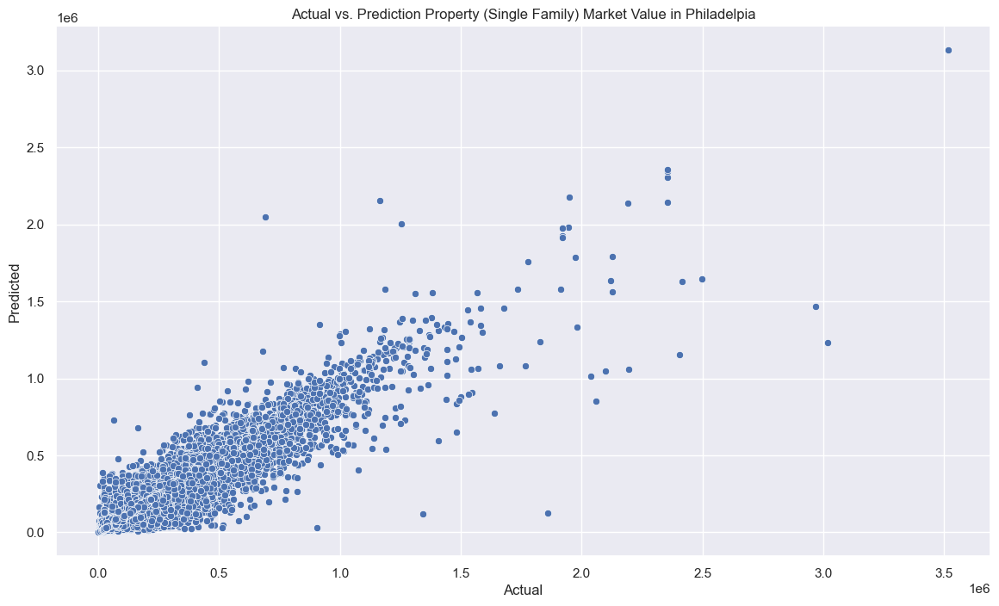

In [ ]:
plt.figure(figsize=(14, 8))
plot = sns.scatterplot(x=y_test_new.values, y=y_pred_after_tuning[0]).set(title='Actual vs. Prediction Property (Single Family) Market Value in Philadelpia', 
                                               xlabel='Actual', 
                                               ylabel='Predicted')

Adanya nilai-nilai error yang besar pada beberapa kasus. Hal ini dapat tergambarkan pula pada plot di atas, di mana terdapat harga aktual yang rendah tapi diprediksi jauh lebih tinggi (overestimation), dan juga sebaliknya (underestimation). Akan tetapi, nilai MAPE yang didapat, yaitu sekitar **12,1%** menjadikan model ini dapat dikategorikan ke dalam **'Good forecasting'** (Lewis, 1982). 

*Source: Lewis, C. D. (1982). Industrial and business forecasting methods: A practical guide to exponential smoothing and curve fitting*

### **Error Analysis**

Selanjutnya kami akan melakukan error analysis, untuk melihat data-data seperti apa saja yang membuat model ini memiliki nilai error yang tinggi. (terutama pada top 5 features nya)

In [ ]:
df_error = y_test_new.copy()
df_error = df_error.to_frame()

df_error['predict'] = y_pred_new[0]
df_error['predict'] = round(df_error['predict'],2)
df_error.sample(5)

,market_value,predict
434839,334200.0,326418.17
810,197400.0,193233.84
329205,52700.0,52700.00
84662,290900.0,210206.05
44122,33900.0,33900.00


Disini saya akan mengecek prediksi mana saja yang memiliki nilai error yang tinggi. Kita dapat mengelompokkan error tersebut ke dalam grup overestimation dan underestimation, lalu memilih 5% error paling ekstrim saja untuk tiap grup. Nantinya pengelompokkan akan menjadi 3 grup, yaitu overestimation (5%), underestimation (5%), dan grup mayoritas yang error-nya mendekati nilai mean (90%). Setelahnya kita bisa mengecek hubungan antara error tersebut dengan tiap variabel independen. Pada akhirnya kita dapat mengetahui sebenarnya variabel mana saja dan aspek apa yang menyebabkan model menghasilkan error yang tinggi, sehingga kita bisa melakukan training ulang dengan penerapan feature engineering lainnya.

In [ ]:
# df_error['market_value'] = np.log(df_error['market_value'])
# df_error['predict'] = np.log(df_error['predict'])

In [ ]:
df_error['error'] = df_error['predict'] - df_error['market_value']

underestimated = df_error['error'].sort_values().iloc[0:int(0.05*len(df_error))].index
overestimated= df_error['error'].sort_values().iloc[-int(0.05*len(df_error)):].index

df_error.loc[overestimated, 'error_group'] = 'overestimated'
df_error.loc[underestimated, 'error_group'] = 'underestimated'
df_error.fillna('majority', inplace=True)

fig = px.scatter(x=df_error['predict'], y=df_error['market_value'], color=df_error['error_group'], width=1500, height=1000)
fig.update_xaxes(title='Predicted value')
fig.update_yaxes(title='Actual value')

In [ ]:
df_error['error_group'].value_counts()

majority          79757
overestimated      4430
underestimated     4430
Name: error_group, dtype: int64

##### 1. fitur `property_age`

In [ ]:
df_error['property_age'] = X_test_new['property_age']
px.histogram(df_error, x=df_error['property_age'], color=df_error['error_group'], opacity=0.6, barmode='group', title="property_age feature",
             width=1500, hover_data=['error'])

Jika kita lihat model ini cenderung memprediksi nilai market jauh lebih rendah (underestimated) dan overestimated dari nilai aktualnya saat nilai umur bangunan nya berada pada nilai 95, 100 dan 105 tahun

##### 2. fitur `overall_condition`

In [ ]:
df_error['overall_condition'] = X_test_new['overall_condition']
px.histogram(df_error, x=df_error['overall_condition'], color=df_error['error_group'], opacity=0.6, barmode='group', title="overall_condition feature",
             width=1500, hover_data=['error'])

Jika kita lihat model ini cenderung menghasilkan error yang besar saat kondisi rumah (interior dan eksterior) bernilai 4 (atau kondisi average), bisa jadi karena data yang kami miliki memang lebih bias ke nilai 4 (di atas 70% dari total data yang ada bernilai 4) sehingga lebih cenderung menghasilkan error besar

##### 3. fitur `total_area`

In [ ]:
df_error['total_area'] = X_test_new['total_area']
px.histogram(df_error, x=df_error['total_area'], color=df_error['error_group'], opacity=0.6, barmode='group', title="total_area feature",
             width=1500, hover_data=['error'])

In [ ]:
X_train[X_train['total_area']==0]

,depth,frontage,number_of_bathrooms,number_of_bedrooms,number_of_rooms,total_area,total_livable_area,region,sale_quarter,new_zoning,overall_condition,property_age,year_sale_built_gap,total_rooms,is_there_a_garage,is_oneFloor,is_singleOwner
543601,0.0,0.0,0.0,0.0,0.0,0.0,1358.0,center_city,2,commercial-industrial-specialpurpose,3,14,11,0.0,0.0,0.0,0.0
547035,0.0,0.0,0.0,2.0,0.0,0.0,1183.0,center_city,3,multi-family-house,4,57,54,2.0,0.0,0.0,0.0
563921,0.0,0.0,0.0,0.0,0.0,0.0,323.0,center_city,2,commercial-industrial-specialpurpose,4,120,112,0.0,0.0,0.0,1.0
568573,0.0,0.0,0.0,0.0,0.0,0.0,1140.0,northeast,3,single-family-house,4,30,18,0.0,0.0,0.0,1.0
546696,0.0,0.0,0.0,2.0,0.0,0.0,1251.0,south,3,commercial-industrial-specialpurpose,3,25,24,2.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
569201,0.0,0.0,0.0,2.0,0.0,0.0,1251.0,west,2,multi-family-house,4,50,32,2.0,0.0,0.0,1.0
550844,0.0,0.0,0.0,0.0,0.0,0.0,691.0,center_city,2,commercial-industrial-specialpurpose,3,120,109,0.0,0.0,0.0,0.0
563915,0.0,0.0,1.0,1.0,3.0,0.0,798.0,north,4,commercial-industrial-specialpurpose,3,14,1,5.0,0.0,0.0,1.0
577457,0.0,0.0,2.0,3.0,6.0,0.0,2100.0,north,1,multi-family-house,4,60,59,11.0,1.0,0.0,1.0


Selanjutnya yaitu pada fitur `total_area` atau luas tanah dari properti

- Seperti yang kita lihat, model kami cenderung menghasilkan error yang besar saat total luas tanah nya bernilai 0 --> kelemahan model
- Sebagai catatan : luas 0 itu sebenarnya tidak benar-benar 0, mungkin bisa saja luas tanahnya kecil jika dibandingkan luas bangunan nya. Contoh rumah kecil yang bertingkat (karena tidak terlalu membutuhkan space tanah yang luas untuk membangun properti semacam ini).
- Salah satu mengatasi masalah ini adalah dengan meng-exclude data luas tanah yang 0 dari pemodelan ini. Tapi bukan berarti data yang ini benar-benar dibuang. Mungkin kita bisa buatkan model prediksi terpisa khusus untuk rumah-rumah susun atau bertingkat yang memang luas tanah nya kecil --> special case

##### 4. fitur `total_liveable_area`

In [ ]:
df_error['total_livable_area'] = X_test_new['total_livable_area']
px.histogram(df_error, x=df_error['total_livable_area'], color=df_error['error_group'], opacity=0.6, barmode='group', title="total_livable_area feature",
             width=1500, hover_data=['error'])

Selanjutnya yaitu pada fitur `total_livable_area` atau luas bangunan dari properti

- Seperti yang kita lihat, model kami cenderung menghasilkan error yang besar pada rentang 1200-1210 sqft --> sebaran data nya banyak di rentang nilai ini
- Selain itu dapat dilihat juga ada error besar banyak juga terjadi di luas bangunan yang bernilai 0. Sama seperti total luas tanah, luas bangunan 0 itu bukan benar-benar 0. Itu kemungkinan artinya ada properti yang memang bangunan nya kecil (mungkin hanya kamar mandi umum atau sejenisnya) tapi berada di area tanah yang luas

##### 5. fitur `region`

In [ ]:
df_error['region'] = X_test_new['region']
px.histogram(df_error, x=df_error['region'], color=df_error['error_group'], opacity=0.6, barmode='group', title="region feature",
             width=1500, hover_data=['error'])

- model kami cenderung menghasilkan error yang besar pada region north philadelphia dan south philadelpia. Salah satu alasan nya karena sebaran data properti lebih banyak tersebar di daerah utara
- Sedangkan untuk region south, menurut kami kenapa error nya besar karena daerah tersebut berbatasan/berdekatan dengan center city (wilayah dengan median harga properti tertinggi) dan juga berdekatan dengan wilayah southwest (wilayah dengan median terkecil). Sehingga variansi nilainya cukup tinggi di daerah ini.

# Conclusion and Recommendation

### **Conclusion**

1. Model yang telah dibangun memiliki score MAPE sebesar 12.1%. yang berarti ketika model yang dibuat digunakan untuk memprediksi nilai properti pada rentang nilai seperti yang dilatih terhadap model (market value: 1,000 USD - 4,160,000 USD ) untuk tipe properti residensial di kota Philadelphia, maka hasil prediksi yang dihasilkan oleh model memiliki kemungkinan tingkat kesalahan sebesar 12.1% dari nilai aslinya. Nilai MAPE yang didapat, yaitu sekitar **12,1%** menjadikan model ini dapat dikategorikan ke dalam **'Good forecasting'** (Lewis, 1982).

2. Performa Model yang kami mencapai target yang ditentukan yatu (MAPE <= 13% dan MAE <= 42,000USD)

3. Berdasarkan model yang dibuat (dilihat dari feature importance) fitur-fitur `property_age`, `total_area`, `overall_condition`, `total_livable_area` dan `region` menjadi fitur yang paling berpengaruh terhadap nilai prediksi harga market properti.

4. Dari analisa kesalahan (*error analysis*) yang dilakukan pada 4 fitur terpenting, terdapat beberapa kondisi pada fitur-fitur tersebut yang membuat model memiliki nilai error yang besar :
    - `property_age` pada nilai 95, 100 dan 105 tahun
    - `total_area` atau luas tanah yang memiliki nilai 0 (artinya tanah nya sempit, tapi luas bangunan besar --> rumah susun/apartemen kecil)
    - `overall_condition` atau kondisi rumah (interior dan eksterior) pada nilai 4 (average) --> sebaran nya paling banyak yaitu di atas 70%
    - `total_livable_area` atau luas bangunan pada nilai 0 dan rentang nilai 1200-1210 sqft
    - `region` yaitu di wilayah phiadelphia utara (north) karena sebaran data nya paling banyak dan selatan (south) karena harga nya beragam atau tidak linier (wilayah ini berada tepat di tengah wilayah dengan nilai median market tertinggi dan terendah )

### **Recommendations**

1. Saat mengecek prediksi mana saja yang memiliki nilai error yang tinggi dan karakteristik untuk 5 fitur terpenting. Pada akhirnya kita dapat mengetahui sebenarnya variabel mana saja dan aspek apa yang menyebabkan model menghasilkan error yang tinggi dengan lebih mendalam, sehingga kita bisa melakukan training ulang dengan penerapan feature engineering lainnya.

2. Jika ada penambahan banyak data, dapat dicoba dengan menggunakan model yang lebih kompleks, seperti recursive neural networks (RNN). Namun, kalau jumlah data dan fiturnya masih seperti dataset ini, kemungkinan besar tidak akan mengubah hasilnya secara signifikan.

3. Model yang sudah dibangun ini bisa dimanfaatkan untuk pengembangan pembuatan model lainnya. Misalkan kita ingin membuat model yang bisa memprediksi properti dengan kategori lain misalkan properti industri maupun apartemen {multi family)

4. Melakukan tuning hyperparameter yang lebih impresif (memperluas parameter space atau menggunakan metodologi lain seperti Bayesian, GridSearch dll), untuk mendapatkan performa terbaik (dan mengurangi overfiiting). Tapi memang dibutuhkan resource/komputer dengan kemampuan komputasi yang lebih tinggi untuk model RandomForest.

#### **Save Model**

In [ ]:
# rf_tuned_estimator

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scaler', StandardScaler(),
                                                  ['depth', 'frontage',
                                                   'number_of_bathrooms',
                                                   'number_of_bedrooms',
                                                   'number_of_rooms',
                                                   'total_area',
                                                   'total_livable_area',
                                                   'property_age',
                                                   'year_sale_built_gap',
                                                   'total_rooms',
                                                   'overall_condition']),
                                                 ('one hot',
                                                  OneHotEncoder(sparse=False),
                                                  ['is_there_a_garage',
                                                   'new_zoning']),
                                                 ('binary', BinaryEncoder(),
                                                  ['region'])])),
                ('model',
                 TransformedTargetRegressor(func=<ufunc 'log'>,
                                            inverse_func=<ufunc 'exp'>,
                                            regressor=RandomForestRegressor(max_depth=80,
                                                                            max_features='auto',
                                                                            min_samples_split=3,
                                                                            n_estimators=1200,
                                                                            random_state=1)))])

In [ ]:
# # Save model
# import pickle

# pickle.dump(rf_tuned_estimator, open('Models/philadelphia_property_price_model.sav', 'wb'))

In [ ]:
# # Load model 
# filename_model= 'Models/philadelphia_property_price_model.sav'
# loaded_model = pickle.load(open(filename_model, 'rb'))

In [ ]:
# #inferensi untuk satu baris data
# loaded_model.predict(X_test.iloc[[0]])